In [29]:
""" Load some libs """
""" python 2 lib using networkx """
import matplotlib.pyplot as plt
import networkx as nx
import random
import math
import pandas as pd
import statsmodels.api as sm
import glob
import os
import numpy as np
from PIL import Image
from helpers import *
import pickle
import time
#random.seed(100)
#tic = time.time()

In [30]:
""" load country centroids """
df_centroids = pd.read_csv('country_centroids.csv', encoding='utf-8').set_index('country')
print df_centroids
#print df_centroids.get_value('TH','latitude')

df_iso2 = pd.read_csv('all_portions.csv', encoding='utf-8').set_index('iso2')
#print df_centroids.get_value('TH','latitude')
df_iso2 = df_iso2.drop(['AX','BL'])
print df_iso2[df_iso2['2017_all'].isnull()]
df_iso2 = df_iso2.drop(df_iso2[df_iso2['2017_all'].isnull()].index.values)

          latitude   longitude                              name
country                                                         
AD       42.546245    1.601554                           Andorra
AE       23.424076   53.847818              United Arab Emirates
AF       33.939110   67.709953                       Afghanistan
AG       17.060816  -61.796428               Antigua and Barbuda
AI       18.220554  -63.068615                          Anguilla
AL       41.153332   20.168331                           Albania
AM       40.069099   45.038189                           Armenia
AN       12.226079  -69.060087              Netherlands Antilles
AO      -11.202692   17.873887                            Angola
AQ      -75.250973   -0.071389                        Antarctica
AR      -38.416097  -63.616672                         Argentina
AS      -14.270972 -170.132217                    American Samoa
AT       47.516231   14.550072                           Austria
AU      -25.274398  133.7

In [31]:
""" generate some country nodes"""
nodes_list = []

for iso2 in df_iso2.index.values:
    if not iso2 in df_centroids.index.values:
        print iso2


for iso2 in df_iso2.index.values:
    print iso2
    g = int(df_iso2.get_value(iso2,'2017_g')/df_iso2.get_value(iso2,'2017_all')*255)
    b = int(df_iso2.get_value(iso2,'2017_b')/df_iso2.get_value(iso2,'2017_all')*255)
    size=np.log10(df_iso2.get_value(iso2,'2017_all'))*3
    
    print size
    

    nodes_list.append(
        (iso2,{
            'type': 'country',
            'region': df_iso2.get_value(iso2,'SIPS_REGION'),
            'pos':np.array([df_centroids.get_value(iso2,'longitude'),df_centroids.get_value(iso2,'latitude')]),
            'n_color':"#{0:02x}{1:02x}{2:02x}".format(clamp(0), clamp(g), clamp(b)),
            'n_alpha':1.0,
            'n_size':size
            })            
        )


#print df_neighbours.NEIGHBORS.str.split(',')
for n in nodes_list:
    print n

print ('VA' in [n[0] for n in nodes_list])

AF
8.43576610406
AL
10.0027917207
DZ
12.8998637697
AS
4.94496291456
AD
5.41446203616
AO
10.8982362306
AI
4.29635730307
AQ
4.15938987924
AG
5.97511326722
AR
13.6807668219
AM
10.6649802721
AW
7.11348076657
AU
14.3506515646
AT
13.0531188374
AZ
11.5263517795
BS
8.50868742892
BH
11.4333419808
BD
12.5704012646
BB
7.30427659896
BY
11.9864393576
BE
12.8188067358
BZ
6.84230858136
BJ
6.8883758304
BM
6.86071605892
BT
9.6403285341
BO
10.0876860382
BA
10.8587649336
BW
8.9439986033
BR
15.586935086
BN
9.06257484575
BG
12.2009445954
BF
8.19180424956
BI
4.84276119219
KH
9.65136011179
CM
9.37603871793
CA
15.4699690285
CV
6.66668186816
KY
6.97342149606
CF
4.2541079769
TD
7.41490470845
CL
13.1221531387
CN
18.4156442838
CO
12.7941181458
KM
3.45429343098
CG
8.40149137996
CD
9.53136748947
CK
3.86360665104
CR
10.603430025
CI
10.0496460295
HR
11.0151970271
CU
11.3154496371
CY
9.94658922969
CZ
12.8546308101
DK
12.1007048856
DJ
6.70279237314
DM
4.22344692715
DO
10.9099116475
EC
11.666101678
EG
13.9005398901
SV
9

/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:11: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  # This is added back by InteractiveShellApp.init_path()
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:12: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  if sys.path[0] == '':
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:13: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  del sys.path[0]
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:21: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/home/lucaskruit

In [32]:
""" load trade data """

df_goods = pd.read_csv('trade_data/all_goods.csv', encoding='utf-8')

cols = ['Classification','Year', 'Trade Flow', 'Commodity Code','Trade Value (US$)','reporter_iso', 'partner_iso']
df_goods = df_goods[cols]
print list(df_goods)
print df_goods['Commodity Code'].unique()
df_goods['Commodity Code'] = df_goods['Commodity Code'].astype(str)
commodities = df_goods['Commodity Code'].unique()

print df_goods

[u'Classification', u'Year', u'Trade Flow', u'Commodity Code', u'Trade Value (US$)', u'reporter_iso', u'partner_iso']
[2716 271600 850231 854140 854150 u'854150' u'TOTAL']
       Classification    Year Trade Flow Commodity Code  Trade Value (US$)  \
0                  H1  2001.0     Import           2716       5.308392e+07   
1                  H1  2001.0     Import           2716       3.426733e+06   
2                  H1  2001.0     Import           2716       2.152746e+06   
3                  H1  2001.0     Import           2716       4.471940e+05   
4                  H1  2001.0     Import           2716       6.741801e+06   
5                  H1  2001.0     Import           2716       3.775944e+07   
6                  H1  2001.0     Import           2716       2.556005e+06   
7                  H1  2001.0     Import           2716       8.900000e+01   
8                  H1  2001.0     Export           2716       1.898609e+06   
9                  H1  2001.0     Import        

In [33]:
"""Where do the import/exports DNE or are off by a large amount"""

#imports A->B ~ exports B->A

#clean non-scope countries
no_data_rep = []
no_data_par = []

for n in df_goods['reporter_iso'].unique():
    if n not in df_iso2.index.values:
        no_data_rep.append(n)
        
for n in df_goods['partner_iso'].unique():
    if n not in df_iso2.index.values:
        no_data_par.append(n)

print df_goods.shape
df_goods = df_goods.drop(df_goods[df_goods['reporter_iso'].isin(no_data_rep)].index)

df_goods = df_goods.drop(df_goods[df_goods['partner_iso'].isin(no_data_par)].index)
print df_goods.shape
        
#print no_data_rep
#print no_data_par

#print df_goods['reporter_iso'].unique()
#print df_goods['partner_iso'].unique()

#probably best to just use reporter and imports -> countries care more about what's coming in than what's going out (and record better data)

(678202, 7)
(543732, 7)


In [35]:
print df_goods[df_goods['Year']==2008]

       Classification    Year Trade Flow Commodity Code  Trade Value (US$)  \
4727               H3  2008.0     Import           2716       4.628650e+05   
4728               H3  2008.0     Export           2716       8.747040e+05   
4729               H3  2008.0     Import           2716       3.426716e+06   
4730               H3  2008.0     Export           2716       1.517119e+07   
4731               H3  2008.0     Import           2716       6.629956e+06   
4732               H3  2008.0     Export           2716       9.186045e+06   
4733               H3  2008.0     Import           2716       1.132000e+03   
4734               H3  2008.0     Export           2716       2.125032e+06   
4737               H3  2008.0     Import           2716       8.057977e+07   
4738               H3  2008.0     Export           2716       2.917330e+07   
4739               H3  2008.0     Export           2716       4.030980e+07   
4740               H3  2008.0     Import           2716       3.

In [40]:
print commodities[0:-1]

['2716' '271600' '850231' '854140' '854150']


2007
2007 2716
[u'AZ' u'AR' u'AT' u'AM' u'BE' u'CA' u'CL' u'CN' u'CO' u'HR' u'CZ' u'DK'
 u'SV' u'EE' u'FI' u'FR' u'PS' u'DE' u'GR' u'HU' u'IE' u'IT' u'JO' u'LV'
 u'LT' u'MN' u'NO' u'PL' u'PT' u'RO' u'RU' u'RS' u'SI' u'ZA' u'ES' u'SE'
 u'CH' u'TH' u'MK' u'GB' u'US' u'UY' u'AL' u'BA' u'BR' u'BY' u'BJ' u'EC'
 u'GE' u'KZ' u'MX' u'MD' u'ME' u'MZ' u'NE' u'VN' u'ZW' u'AE' u'ZM' u'BW'
 u'SZ']


/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:23: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:24: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:25: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:37: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
/home/lucaskruitwagen/miniconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:38: FutureWarning: get_v

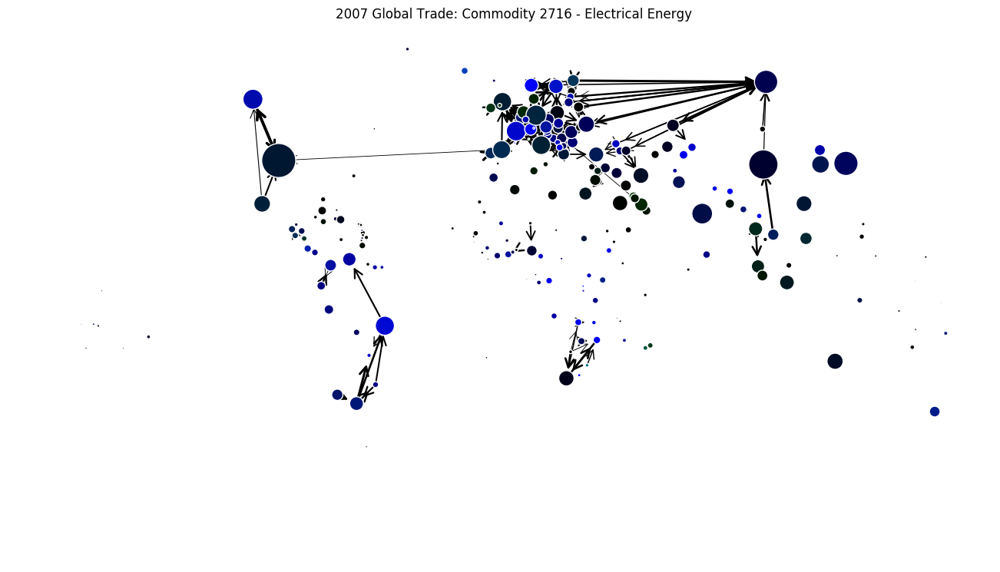

2007 271600
[u'AZ' u'AR' u'AT' u'AM' u'BE' u'CA' u'CL' u'CN' u'CO' u'HR' u'CZ' u'DK'
 u'SV' u'EE' u'FI' u'FR' u'PS' u'DE' u'GR' u'HU' u'IE' u'IT' u'JO' u'LV'
 u'LT' u'MN' u'NO' u'PL' u'PT' u'RO' u'RU' u'RS' u'SI' u'ZA' u'ES' u'SE'
 u'CH' u'TH' u'MK' u'GB' u'US' u'UY' u'AL' u'BA' u'BR' u'BY' u'BJ' u'EC'
 u'GE' u'KZ' u'MX' u'MD' u'ME' u'MZ' u'NE' u'VN' u'ZW' u'AE' u'ZM' u'BW'
 u'SZ']


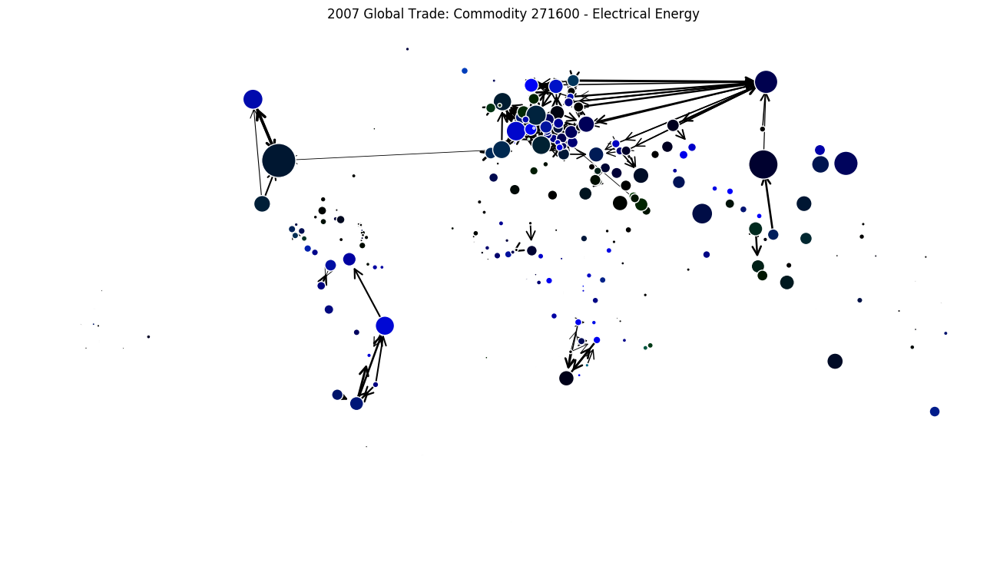

2007 850231
[u'AR' u'AU' u'AT' u'BE' u'BG' u'CA' u'CN' u'EE' u'FR' u'DE' u'GR' u'HU'
 u'IT' u'JP' u'KR' u'LT' u'NL' u'NZ' u'PL' u'PT' u'RO' u'ES' u'SD' u'SE'
 u'TH' u'TR' u'GB' u'US' u'UY' u'AO' u'BR' u'EC' u'MX' u'OM' u'NC']


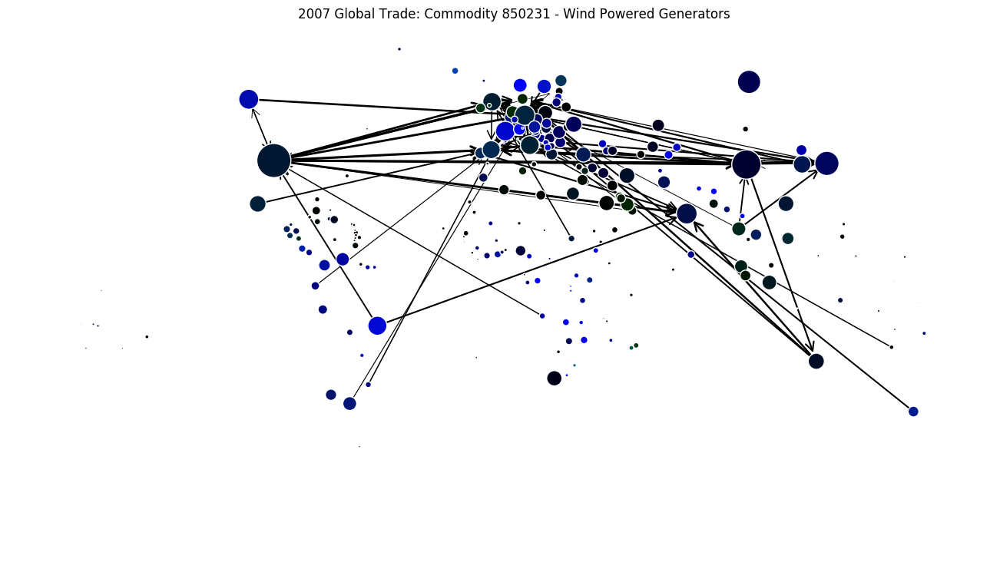

2007 854140
[u'DZ' u'AR' u'AU' u'AT' u'BE' u'BG' u'KH' u'CA' u'CL' u'CN' u'CO' u'HR'
 u'CY' u'CZ' u'DK' u'EE' u'FI' u'FR' u'DE' u'GR' u'HU' u'IE' u'IL' u'IT'
 u'JP' u'KR' u'LT' u'LU' u'MN' u'NL' u'NZ' u'NO' u'PL' u'PT' u'RO' u'RU'
 u'SA' u'SG' u'SK' u'SI' u'ZA' u'ES' u'SE' u'CH' u'TH' u'TR' u'GB' u'US'
 u'AO' u'BD' u'BR' u'LK' u'PF' u'KZ' u'KE' u'KW' u'MY' u'MX' u'MA' u'MZ'
 u'NG' u'PH' u'SN' u'IN' u'VN' u'AE' u'UG' u'TZ' u'BF' u'VE' u'ID' u'UA']


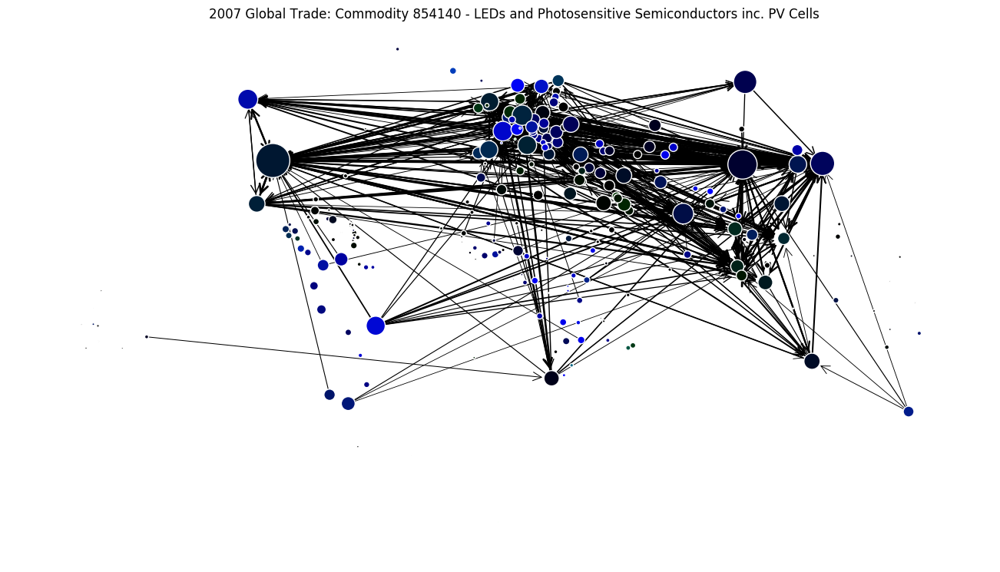

2007 854150
[u'AU' u'AT' u'BE' u'CA' u'CN' u'CR' u'CZ' u'DK' u'FI' u'FR' u'DE' u'HU'
 u'IE' u'IL' u'IT' u'JP' u'KR' u'NL' u'SG' u'ES' u'SE' u'CH' u'TH' u'TR'
 u'GB' u'US' u'BR' u'MY' u'MX' u'PH' u'IN' u'VN' u'AE' u'TN' u'VE' u'ID']


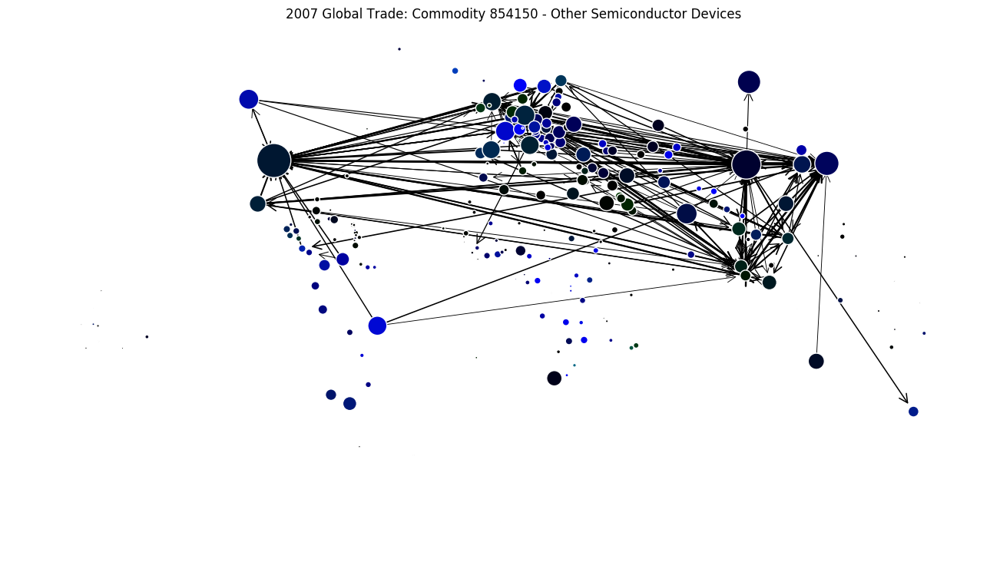

2008
2008 2716
[u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BR' u'BG' u'BY' u'CA' u'CL' u'CO'
 u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'PS' u'DE' u'GR' u'HU'
 u'IE' u'IT' u'JO' u'LV' u'LT' u'MX' u'ME' u'NL' u'NO' u'PL' u'PT' u'RO'
 u'RU' u'RS' u'VN' u'SI' u'ZA' u'ZW' u'ES' u'SE' u'CH' u'TH' u'UG' u'MK'
 u'EG' u'GB' u'TZ' u'US' u'UY' u'AL' u'BJ' u'GE' u'KZ' u'MD' u'MA' u'MZ'
 u'NE' u'UA' u'BW' u'LS']


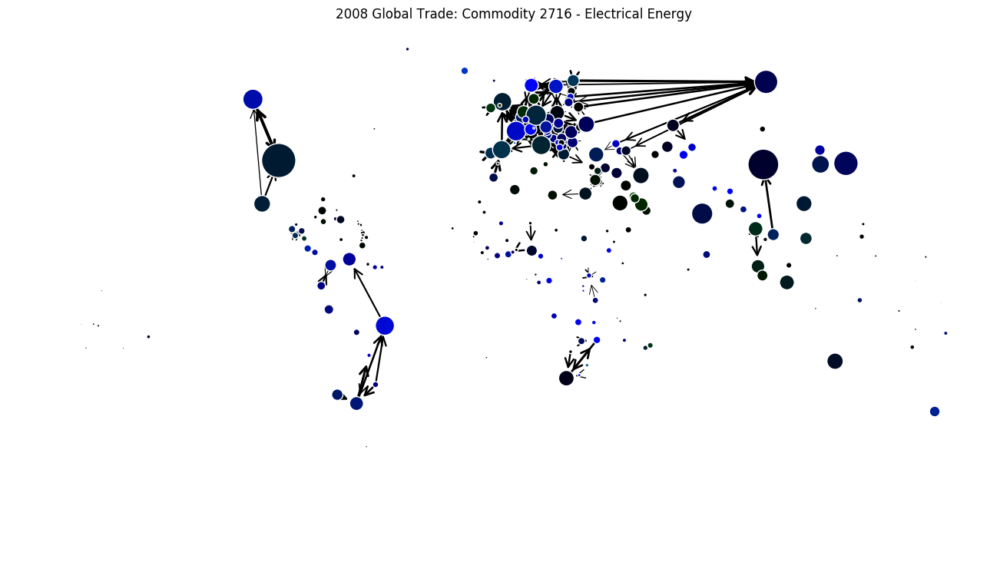

2008 271600
[u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BR' u'BG' u'BY' u'CA' u'CL' u'CO'
 u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'PS' u'DE' u'GR' u'HU'
 u'IE' u'IT' u'JO' u'LV' u'LT' u'MX' u'ME' u'NL' u'NO' u'PL' u'PT' u'RO'
 u'RU' u'RS' u'VN' u'SI' u'ZA' u'ZW' u'ES' u'SE' u'CH' u'TH' u'UG' u'MK'
 u'EG' u'GB' u'TZ' u'US' u'UY' u'AL' u'BJ' u'GE' u'KZ' u'MD' u'MA' u'MZ'
 u'NE' u'UA' u'BW' u'LS']


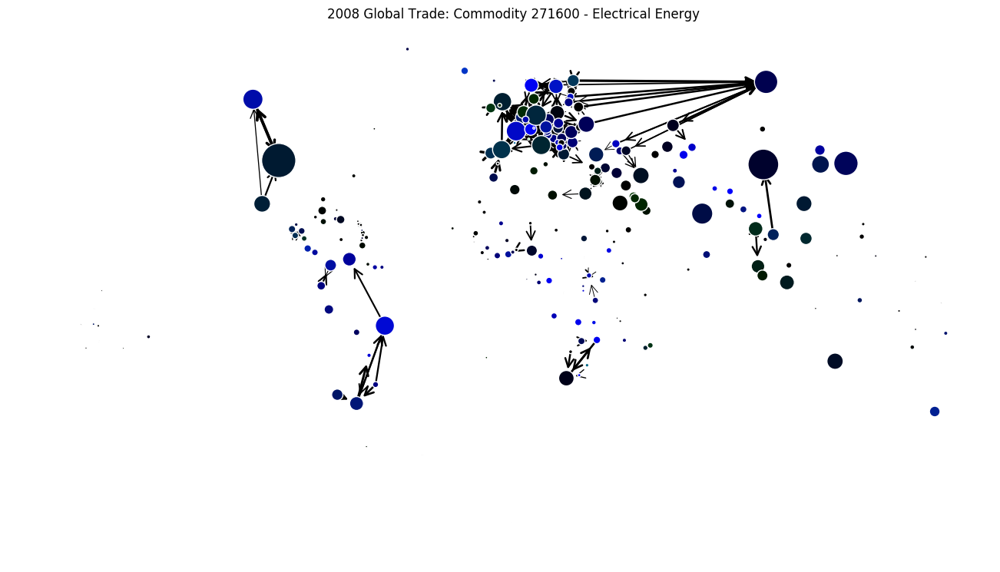

2008 850231
[u'AZ' u'AU' u'AT' u'BE' u'BR' u'BG' u'CA' u'CL' u'CN' u'CR' u'HR' u'FR'
 u'DE' u'GR' u'IE' u'IT' u'JP' u'KR' u'LV' u'MX' u'NL' u'NC' u'NZ' u'NO'
 u'PL' u'PT' u'RO' u'RU' u'SA' u'ES' u'SE' u'CH' u'TH' u'TR' u'GB' u'US'
 u'DM' u'IN' u'ID']


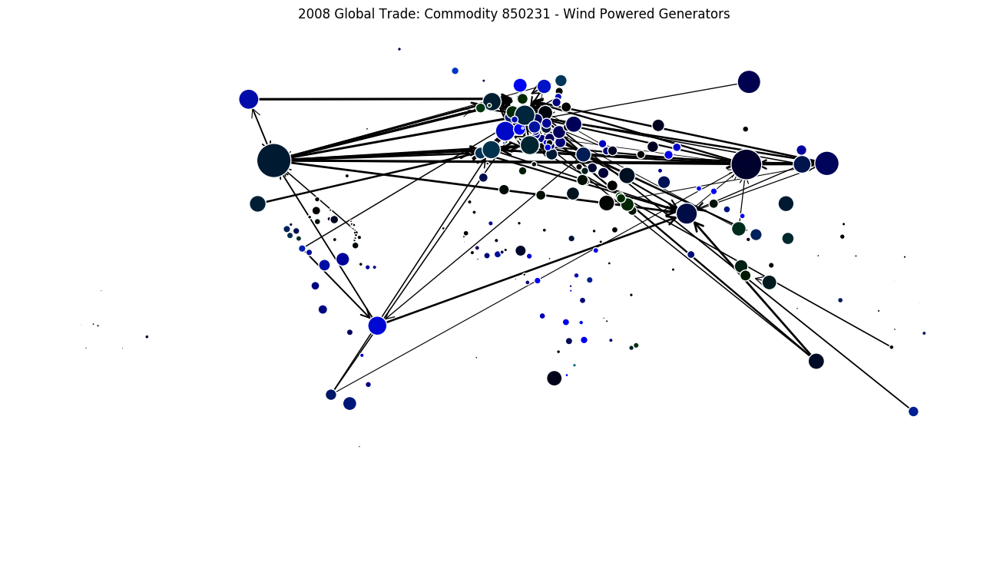

2008 854140
[u'DZ' u'AR' u'AU' u'AT' u'BD' u'BE' u'BO' u'BR' u'BG' u'BY' u'CA' u'LK'
 u'CL' u'CN' u'CO' u'HR' u'CY' u'CZ' u'DK' u'EC' u'EE' u'FJ' u'FI' u'FR'
 u'DE' u'GR' u'HU' u'IE' u'IL' u'IT' u'CI' u'JM' u'JP' u'KE' u'KR' u'LT'
 u'LU' u'MG' u'ML' u'MX' u'NL' u'NZ' u'NO' u'PK' u'PL' u'PT' u'RO' u'RU'
 u'SA' u'SN' u'RS' u'SG' u'SK' u'VN' u'SI' u'ZA' u'ES' u'SE' u'CH' u'TH'
 u'AE' u'TN' u'TR' u'UG' u'EG' u'GB' u'US' u'PF' u'GN' u'MY' u'MA' u'NG'
 u'PH' u'IN' u'UA' u'BF' u'VE' u'ID']


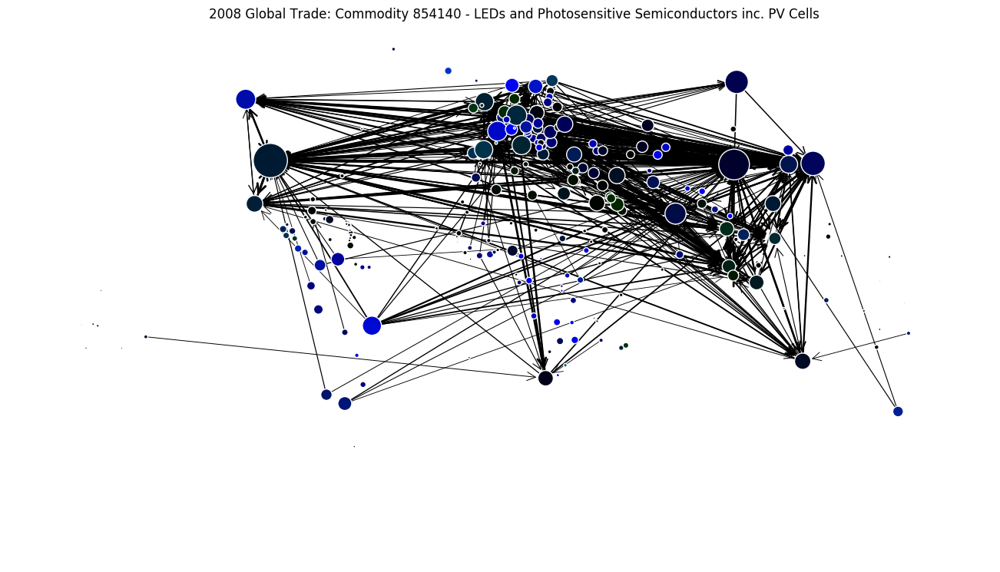

2008 854150
[u'AU' u'AT' u'BE' u'BR' u'CA' u'CN' u'CR' u'CZ' u'DK' u'EE' u'FI' u'FR'
 u'DE' u'HU' u'IL' u'IT' u'JP' u'KR' u'MG' u'MX' u'NL' u'NZ' u'PL' u'SG'
 u'VN' u'ES' u'SE' u'CH' u'TH' u'AE' u'TN' u'GB' u'US' u'MY' u'PH' u'IN'
 u'VE' u'ID']


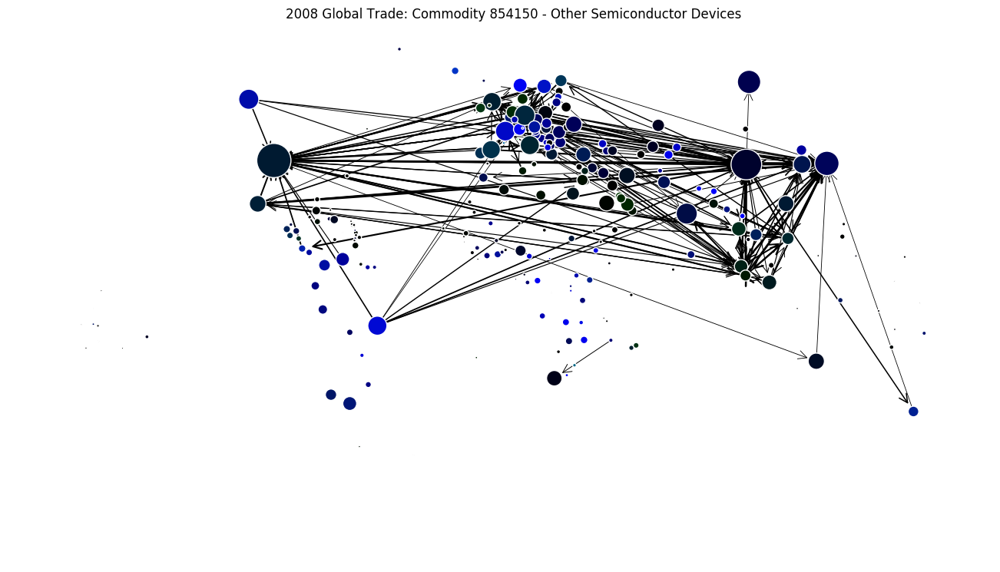

2009
2009 2716
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BT' u'BA' u'BR' u'BG' u'BY' u'CA'
 u'CL' u'CN' u'CO' u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'PS'
 u'DE' u'GR' u'GT' u'HU' u'IE' u'IT' u'KZ' u'JO' u'LV' u'LT' u'MX' u'ME'
 u'NE' u'NO' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA' u'ZW' u'ES'
 u'SE' u'CH' u'TH' u'UG' u'MK' u'GB' u'US' u'UY' u'BW' u'BJ' u'GH' u'MA'
 u'MZ' u'UA' u'LS']


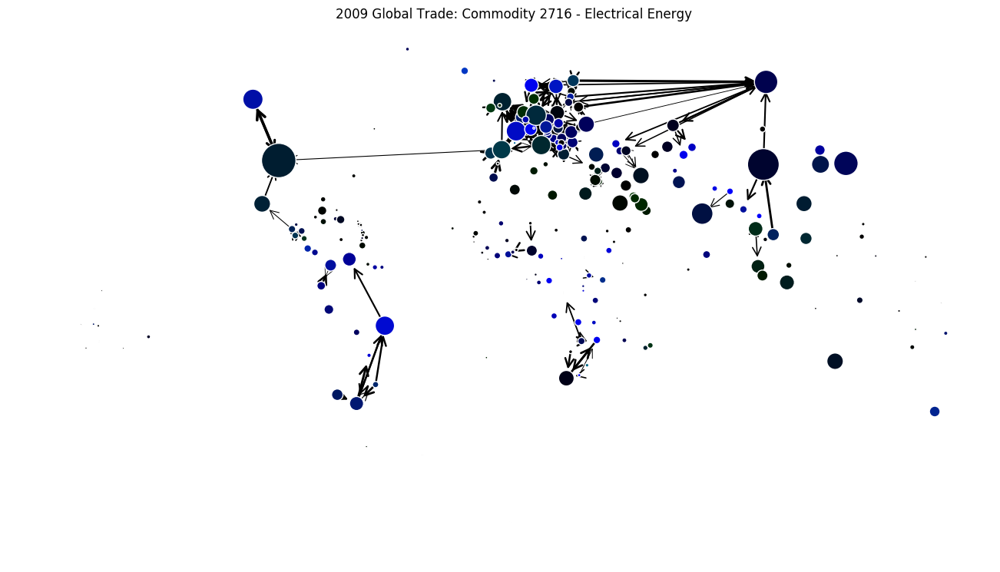

2009 271600
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BT' u'BA' u'BR' u'BG' u'BY' u'CA'
 u'CL' u'CN' u'CO' u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'PS'
 u'DE' u'GR' u'GT' u'HU' u'IE' u'IT' u'KZ' u'JO' u'LV' u'LT' u'MX' u'ME'
 u'NE' u'NO' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA' u'ZW' u'ES'
 u'SE' u'CH' u'TH' u'UG' u'MK' u'GB' u'US' u'UY' u'BW' u'BJ' u'GH' u'MA'
 u'MZ' u'UA' u'LS']


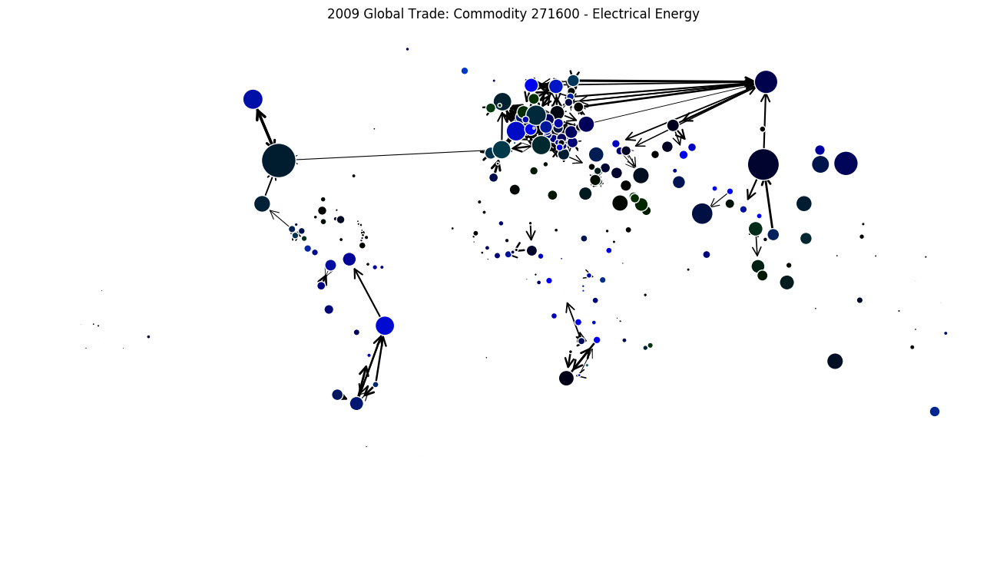

2009 850231
[u'AO' u'AZ' u'AU' u'AT' u'BE' u'BR' u'BG' u'CA' u'CL' u'CN' u'HR' u'CY'
 u'DK' u'FR' u'DE' u'GR' u'IE' u'IT' u'JP' u'KR' u'LV' u'MX' u'NL' u'AW'
 u'NZ' u'NG' u'NO' u'PL' u'PT' u'RO' u'SA' u'ES' u'SD' u'SE' u'CH' u'TH'
 u'TR' u'EG' u'GB' u'US' u'VE']


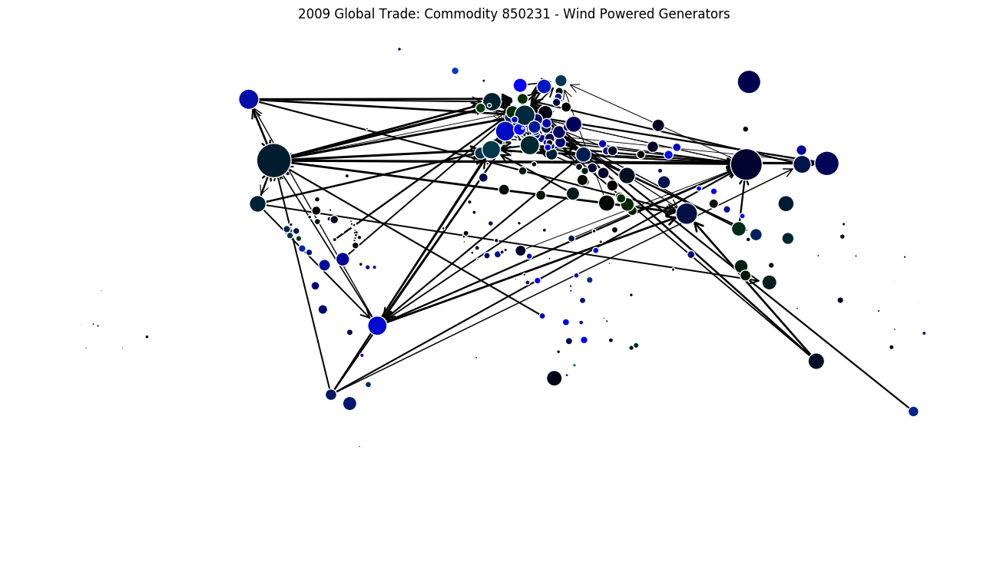

2009 854140
[u'DZ' u'AR' u'AU' u'AT' u'BS' u'BD' u'BE' u'BR' u'BN' u'BG' u'BY' u'KH'
 u'CA' u'CL' u'CN' u'CO' u'HR' u'CY' u'CZ' u'DK' u'ET' u'EE' u'FI' u'FR'
 u'PF' u'DE' u'GR' u'HU' u'IE' u'IL' u'IT' u'CI' u'JP' u'KE' u'KR' u'LU'
 u'MY' u'MX' u'NP' u'NL' u'NC' u'NZ' u'NE' u'NG' u'NO' u'PE' u'PL' u'PT'
 u'RO' u'RU' u'SA' u'SN' u'RS' u'IN' u'SG' u'SK' u'VN' u'SI' u'ZA' u'ES'
 u'SE' u'CH' u'TH' u'TN' u'TR' u'UG' u'MK' u'EG' u'GB' u'TZ' u'US' u'BW'
 u'CM' u'GH' u'MA' u'PH' u'UA' u'VE' u'ID']


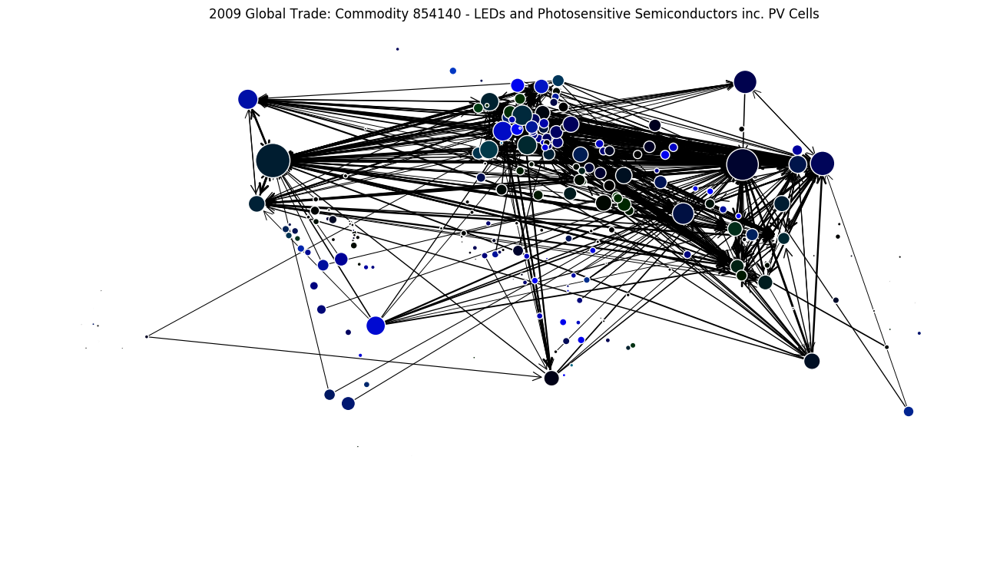

2009 854150
[u'AT' u'BE' u'BR' u'CA' u'CN' u'CR' u'CZ' u'DK' u'FI' u'FR' u'DE' u'GR'
 u'HU' u'IL' u'IT' u'JP' u'KR' u'MY' u'MX' u'NL' u'NO' u'PL' u'IN' u'SG'
 u'VN' u'ES' u'SE' u'CH' u'TH' u'TN' u'UG' u'GB' u'US' u'PH' u'ID']


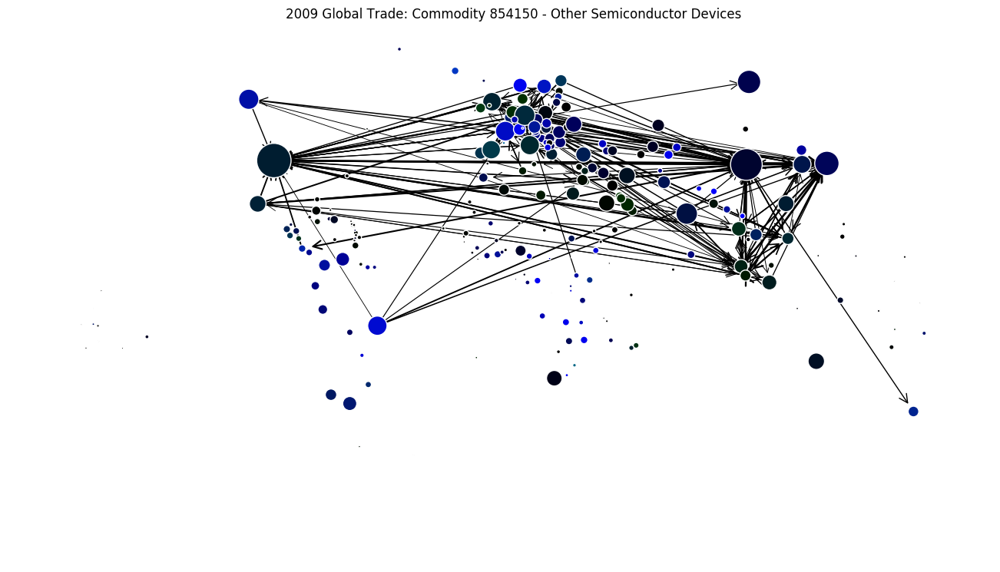

2010
2010 2716
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BR' u'BG' u'BY' u'CA' u'CL'
 u'CN' u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'PS' u'DE' u'GR'
 u'GT' u'HU' u'IE' u'IT' u'KZ' u'JO' u'LA' u'LV' u'LT' u'MX' u'MD' u'ME'
 u'NL' u'NE' u'NO' u'PK' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA'
 u'ZW' u'ES' u'SE' u'CH' u'TH' u'TR' u'UG' u'MK' u'EG' u'GB' u'US' u'UY'
 u'BW' u'BJ' u'MA' u'MZ' u'UA' u'LS']


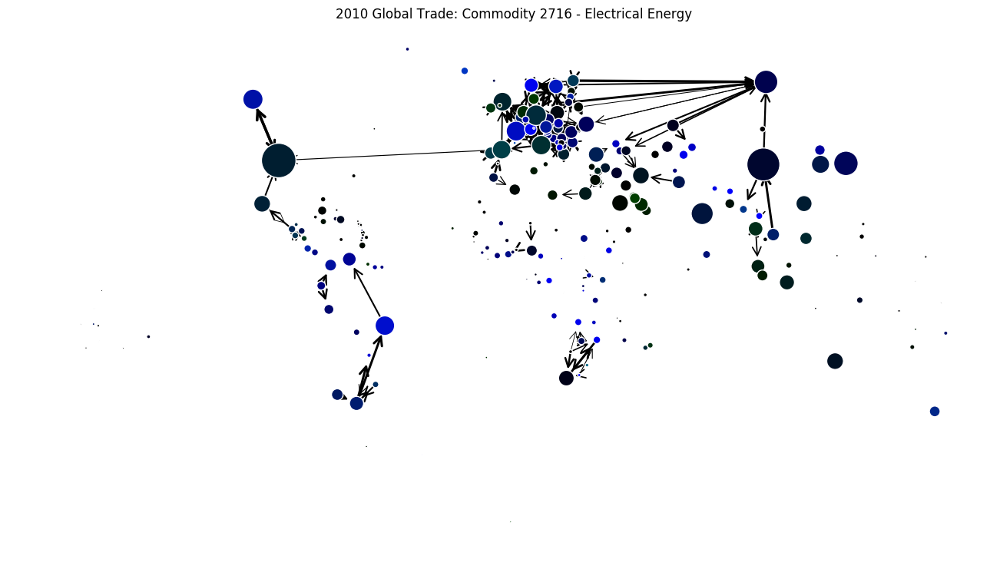

2010 271600
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BR' u'BG' u'BY' u'CA' u'CL'
 u'CN' u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'PS' u'DE' u'GR'
 u'GT' u'HU' u'IE' u'IT' u'KZ' u'JO' u'LA' u'LV' u'LT' u'MX' u'MD' u'ME'
 u'NL' u'NE' u'NO' u'PK' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA'
 u'ZW' u'ES' u'SE' u'CH' u'TH' u'TR' u'UG' u'MK' u'EG' u'GB' u'US' u'UY'
 u'BW' u'BJ' u'MA' u'MZ' u'UA' u'LS']


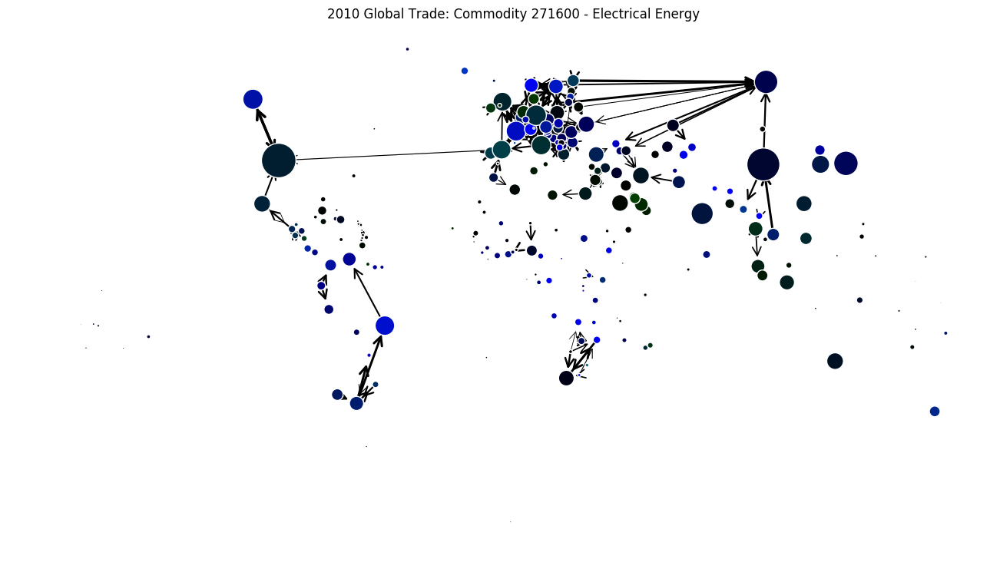

2010 850231
[u'AZ' u'AR' u'AU' u'BE' u'BR' u'BG' u'CA' u'LK' u'CL' u'CN' u'HR' u'DK'
 u'ET' u'FR' u'DE' u'GR' u'HU' u'IE' u'IL' u'IT' u'JP' u'MX' u'NL' u'NZ'
 u'NO' u'PL' u'RO' u'RU' u'IN' u'ES' u'SD' u'SE' u'CH' u'TH' u'TR' u'GB'
 u'US' u'UY' u'IR' u'VE']


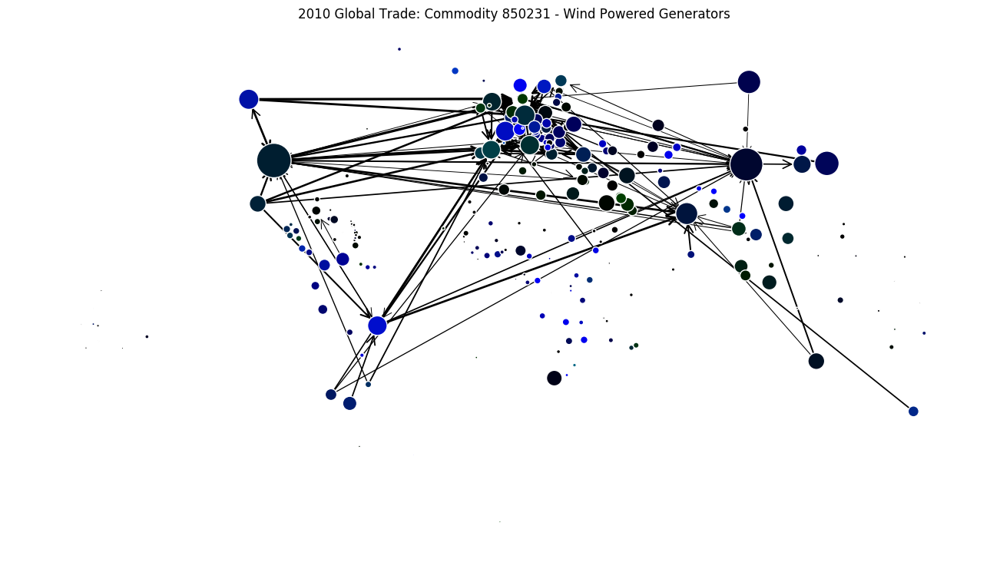

2010 854140
[u'DZ' u'AO' u'AR' u'AU' u'AT' u'BD' u'BE' u'BR' u'BN' u'BG' u'BY' u'CA'
 u'CV' u'LK' u'CL' u'CN' u'CO' u'CR' u'HR' u'CY' u'CZ' u'DK' u'EE' u'FI'
 u'FR' u'PF' u'DE' u'GH' u'GR' u'HU' u'ID' u'IE' u'IL' u'IT' u'JP' u'KZ'
 u'KE' u'KR' u'LT' u'LU' u'MG' u'MY' u'ML' u'MT' u'MX' u'NP' u'NL' u'NZ'
 u'NI' u'NG' u'NO' u'PK' u'PE' u'PL' u'PT' u'RO' u'RU' u'RS' u'IN' u'SG'
 u'SK' u'VN' u'SI' u'ZA' u'ZW' u'ES' u'SE' u'CH' u'TH' u'TN' u'TR' u'UG'
 u'MK' u'EG' u'GB' u'TZ' u'US' u'BW' u'CM' u'IR' u'MA' u'PH' u'UA' u'VE']


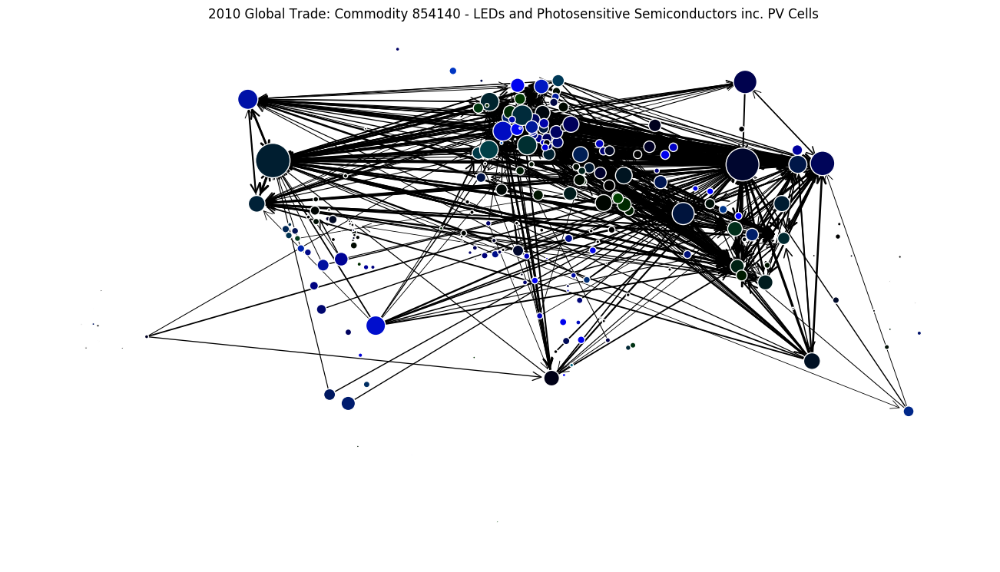

2010 854150
[u'AO' u'AU' u'AT' u'BE' u'BR' u'BG' u'CA' u'CN' u'CR' u'CZ' u'DK' u'FI'
 u'FR' u'DE' u'HU' u'ID' u'IE' u'IL' u'IT' u'JP' u'KR' u'MY' u'MX' u'NL'
 u'PK' u'PL' u'RO' u'SA' u'IN' u'SG' u'VN' u'ES' u'SE' u'CH' u'TH' u'TN'
 u'GB' u'US' u'MA' u'PH' u'VE']


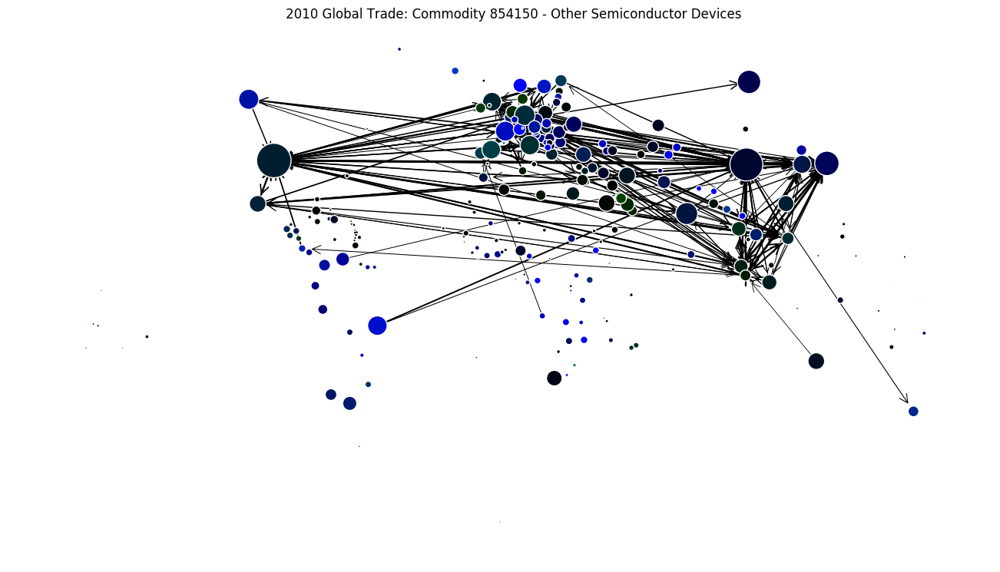

2011
2011 2716
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BR' u'BG' u'BY' u'CA' u'CL'
 u'CN' u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'PS' u'DE' u'GR'
 u'GT' u'HU' u'IE' u'IT' u'KZ' u'JO' u'LA' u'LV' u'LT' u'MY' u'MX' u'ME'
 u'NL' u'NE' u'NO' u'PK' u'PE' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI'
 u'ZA' u'ZW' u'ES' u'SE' u'CH' u'TH' u'TR' u'UG' u'UA' u'MK' u'EG' u'GB'
 u'US' u'UY' u'ZM' u'BW' u'BJ' u'LS' u'MA' u'MZ' u'VE']


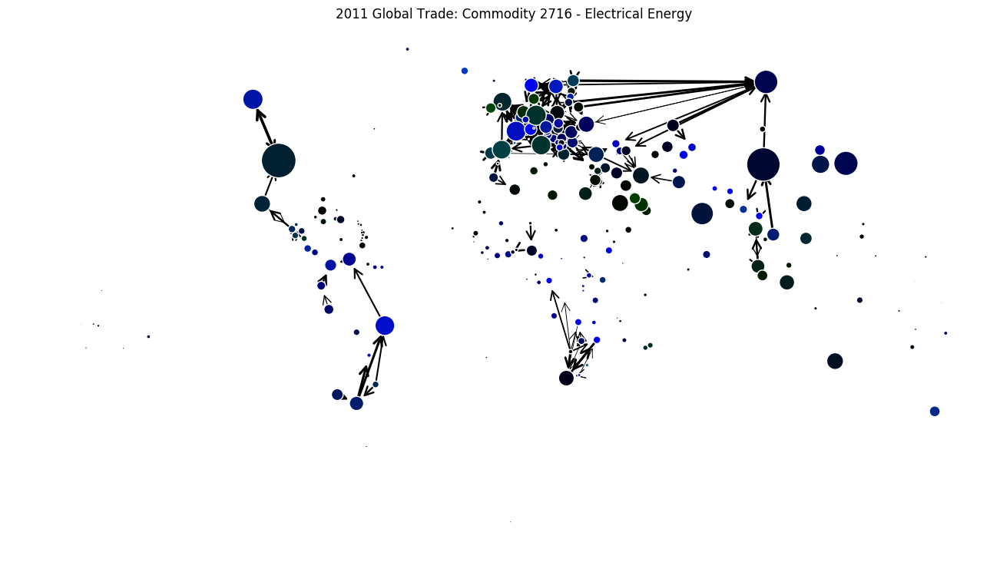

2011 271600
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BR' u'BG' u'BY' u'CA' u'CL'
 u'CN' u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'PS' u'DE' u'GR'
 u'GT' u'HU' u'IE' u'IT' u'KZ' u'JO' u'LA' u'LV' u'LT' u'MY' u'MX' u'ME'
 u'NL' u'NE' u'NO' u'PK' u'PE' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI'
 u'ZA' u'ZW' u'ES' u'SE' u'CH' u'TH' u'TR' u'UG' u'UA' u'MK' u'EG' u'GB'
 u'US' u'UY' u'ZM' u'BW' u'BJ' u'LS' u'MA' u'MZ' u'VE']


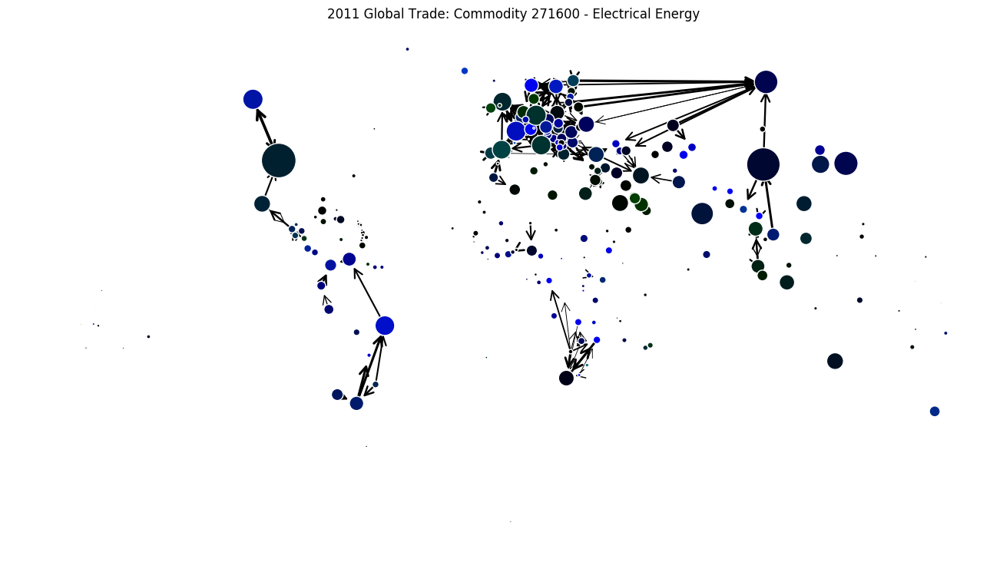

2011 850231
[u'AZ' u'AU' u'AT' u'BE' u'BR' u'BG' u'BY' u'CA' u'CV' u'LK' u'CL' u'CN'
 u'CR' u'HR' u'CZ' u'ET' u'EE' u'FR' u'DE' u'GR' u'IR' u'IE' u'IT' u'JP'
 u'KZ' u'KR' u'MX' u'NL' u'NZ' u'NO' u'PK' u'PL' u'PT' u'RO' u'RU' u'IN'
 u'VN' u'ES' u'SE' u'CH' u'TR' u'UA' u'GB' u'US' u'YE' u'MA' u'OM' u'VE']


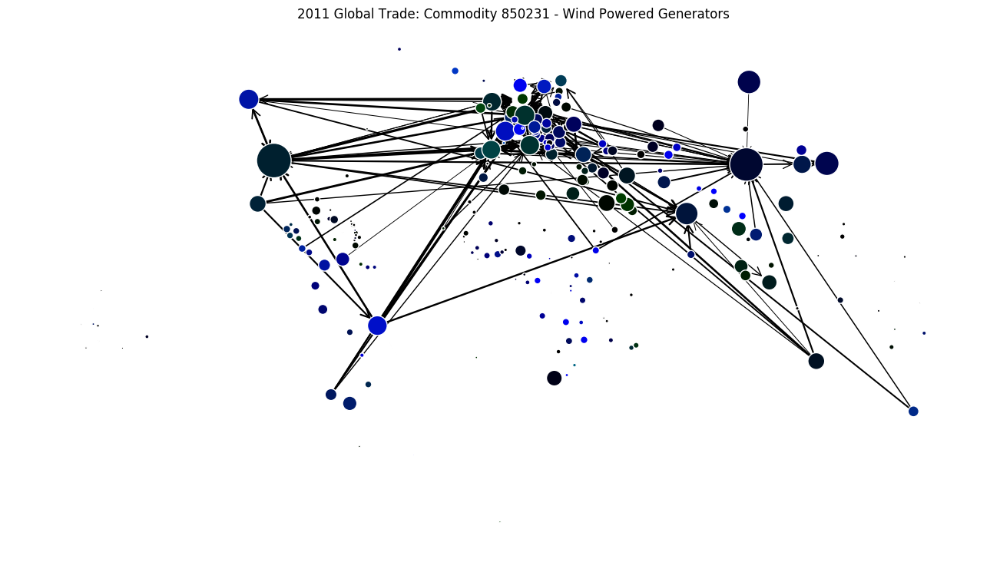

2011 854140
[u'DZ' u'AO' u'AR' u'AU' u'AT' u'BS' u'BD' u'BE' u'BR' u'BG' u'MM' u'BY'
 u'KH' u'CA' u'LK' u'CL' u'CN' u'CO' u'CR' u'HR' u'CY' u'CZ' u'DK' u'EC'
 u'EE' u'FI' u'FR' u'PF' u'DE' u'GH' u'GR' u'GT' u'HN' u'HU' u'ID' u'IR'
 u'IE' u'IL' u'IT' u'JM' u'JP' u'KZ' u'JO' u'KR' u'LT' u'LU' u'MY' u'ML'
 u'MT' u'MU' u'MX' u'NP' u'NL' u'NZ' u'NI' u'NE' u'NG' u'NO' u'PK' u'PA'
 u'PE' u'PL' u'PT' u'RO' u'RU' u'SA' u'SN' u'RS' u'IN' u'SG' u'SK' u'VN'
 u'SI' u'ZA' u'ES' u'SE' u'CH' u'TH' u'TN' u'TR' u'UG' u'UA' u'MK' u'GB'
 u'TZ' u'US' u'BF' u'UY' u'BB' u'BW' u'MA' u'PH' u'VE']


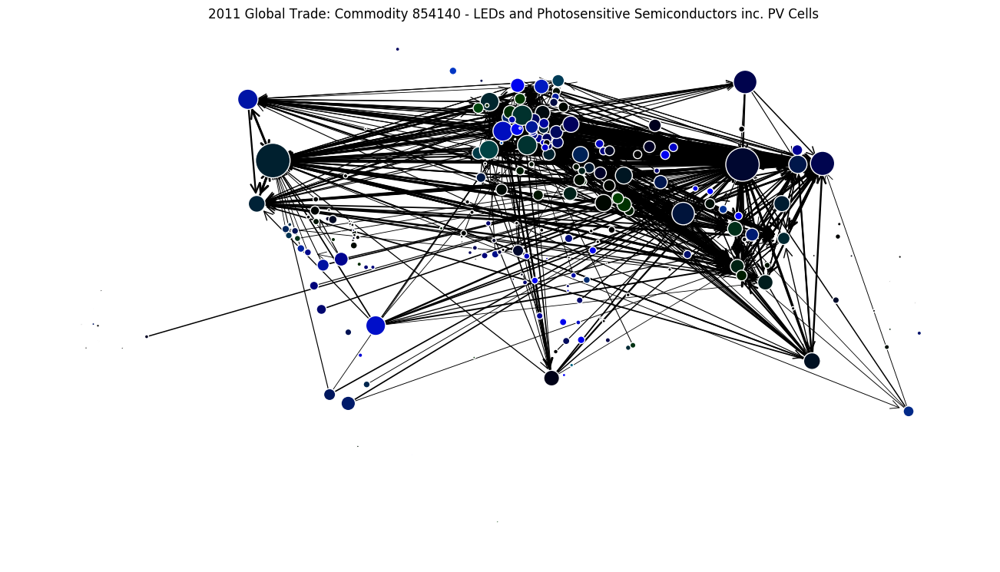

2011 854150
[u'AU' u'AT' u'BE' u'BR' u'BG' u'CA' u'CN' u'CR' u'CZ' u'DK' u'FI' u'FR'
 u'DE' u'GR' u'HU' u'ID' u'IL' u'IT' u'JP' u'KR' u'MY' u'MX' u'NL' u'PK'
 u'PL' u'RO' u'IN' u'SG' u'SK' u'VN' u'ES' u'SE' u'CH' u'TH' u'TN' u'TR'
 u'GB' u'US' u'MA' u'PH']


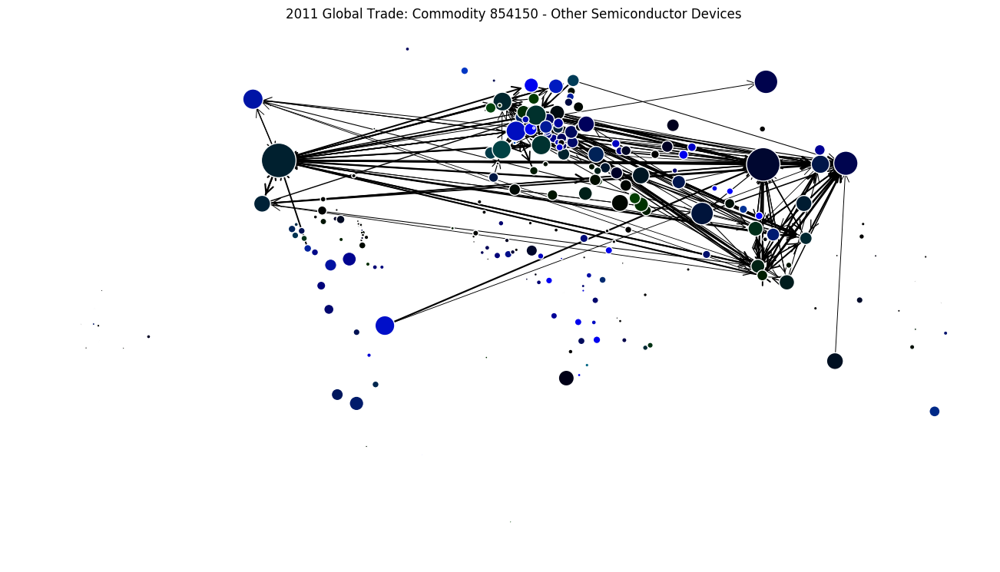

2012
2012 2716
[u'AL' u'AZ' u'AR' u'AT' u'BE' u'BA' u'BR' u'BG' u'BY' u'CA' u'CL' u'CN'
 u'HR' u'CZ' u'DK' u'SV' u'EE' u'FI' u'FR' u'DE' u'GR' u'GT' u'HU' u'IE'
 u'IT' u'KZ' u'JO' u'LV' u'LT' u'MX' u'ME' u'NL' u'NO' u'PK' u'PE' u'PL'
 u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA' u'ES' u'SE' u'CH' u'TH' u'TR'
 u'UG' u'MK' u'GB' u'US' u'UY' u'ZM' u'AM' u'EC' u'PS' u'MZ' u'NE' u'ZW'
 u'UA' u'EG' u'BW' u'BJ' u'LS' u'MA' u'VE']


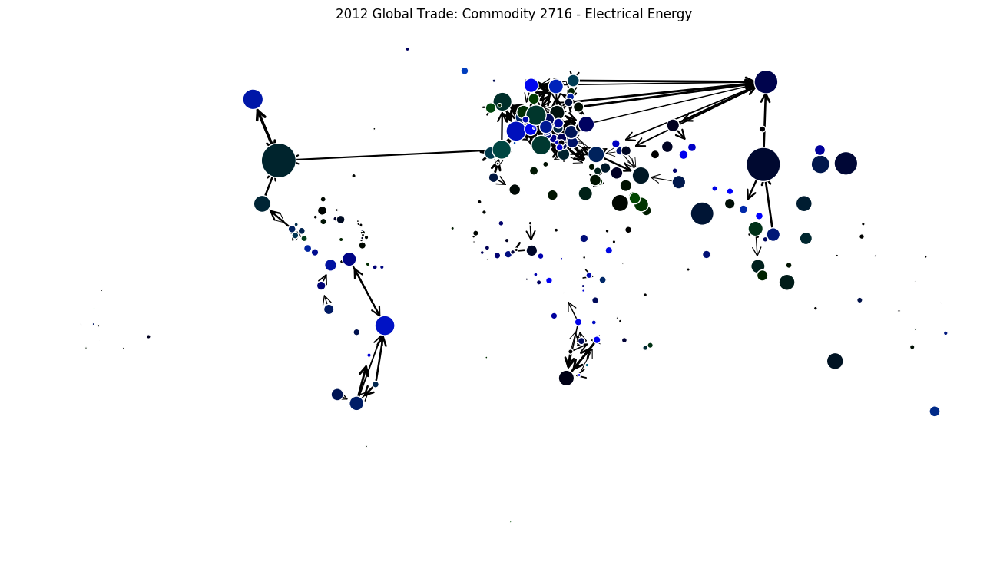

2012 271600
[u'AL' u'AZ' u'AR' u'AT' u'BE' u'BA' u'BR' u'BG' u'BY' u'CA' u'CL' u'CN'
 u'HR' u'CZ' u'DK' u'SV' u'EE' u'FI' u'FR' u'DE' u'GR' u'GT' u'HU' u'IE'
 u'IT' u'KZ' u'JO' u'LV' u'LT' u'MX' u'ME' u'NL' u'NO' u'PK' u'PE' u'PL'
 u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA' u'ES' u'SE' u'CH' u'TH' u'TR'
 u'UG' u'MK' u'GB' u'US' u'UY' u'ZM' u'AM' u'EC' u'PS' u'MZ' u'NE' u'ZW'
 u'UA' u'EG' u'BW' u'BJ' u'LS' u'MA' u'VE']


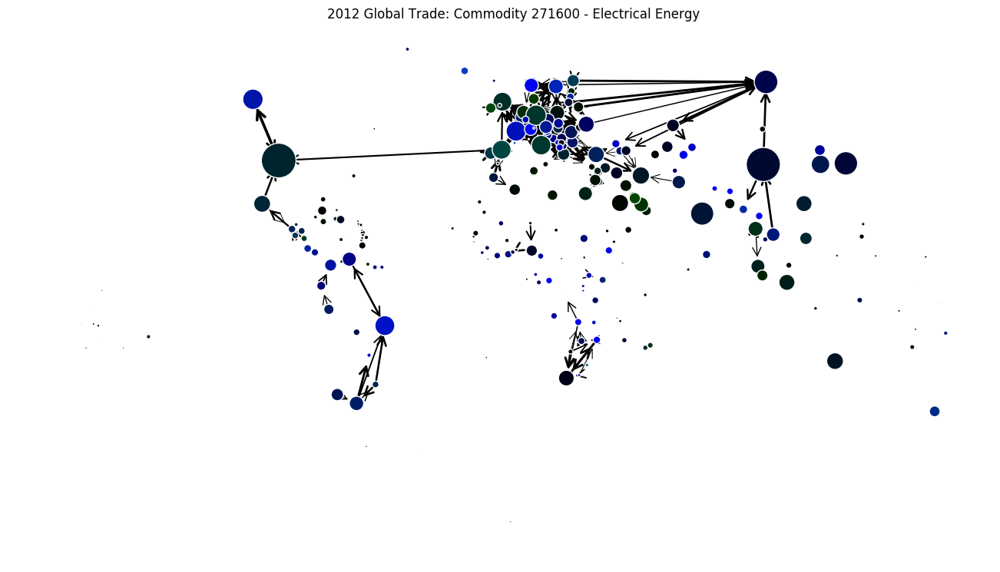

2012 850231
[u'AZ' u'AU' u'AT' u'BE' u'BR' u'BG' u'BY' u'CA' u'CL' u'CN' u'HR' u'CZ'
 u'FI' u'FR' u'DE' u'GR' u'ID' u'IE' u'IT' u'JP' u'LV' u'LT' u'MX' u'NL'
 u'NI' u'NO' u'PK' u'PL' u'RO' u'RU' u'SG' u'ES' u'SE' u'CH' u'TH' u'TR'
 u'GB' u'US' u'UY' u'LK' u'EC' u'ET' u'MY' u'IN' u'UA' u'MA' u'VE']


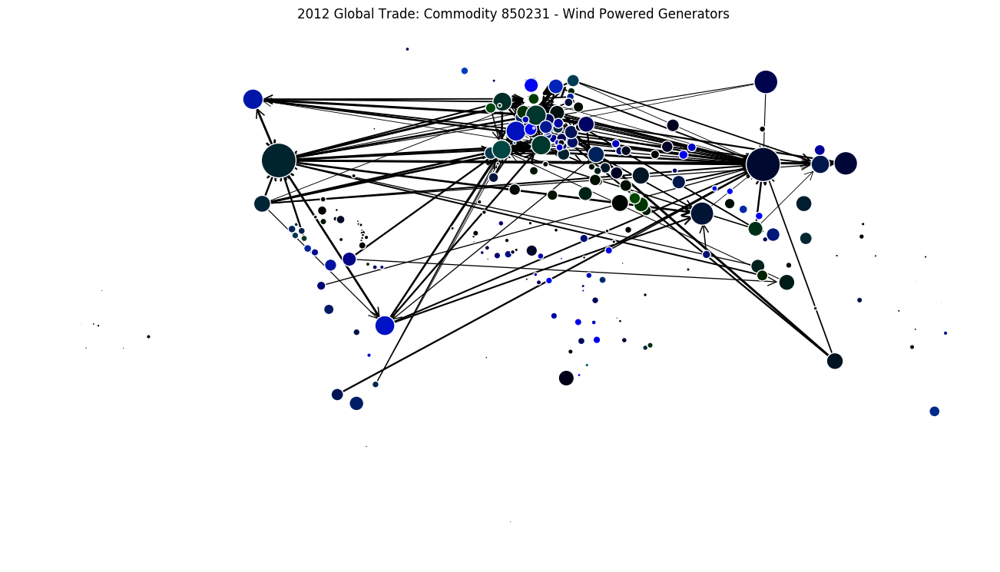

2012 854140
[u'DZ' u'AR' u'AU' u'AT' u'BD' u'BE' u'BA' u'BR' u'BG' u'MM' u'BY' u'KH'
 u'CA' u'CL' u'CN' u'CO' u'CR' u'HR' u'CY' u'CZ' u'DK' u'EE' u'FI' u'FR'
 u'PF' u'DE' u'GR' u'GT' u'HU' u'ID' u'IE' u'IL' u'IT' u'JP' u'KZ' u'JO'
 u'KR' u'LA' u'LB' u'LT' u'LU' u'MG' u'MT' u'MU' u'MX' u'NL' u'NZ' u'NI'
 u'NO' u'PK' u'PE' u'PL' u'PT' u'RO' u'RU' u'SA' u'RS' u'SG' u'SK' u'VN'
 u'SI' u'ZA' u'ES' u'SE' u'CH' u'TH' u'AE' u'TN' u'TR' u'UG' u'MK' u'GB'
 u'US' u'UY' u'AO' u'BS' u'BZ' u'EC' u'ET' u'GH' u'JM' u'MW' u'MY' u'ML'
 u'NP' u'NE' u'NG' u'RW' u'SN' u'IN' u'ZW' u'UA' u'EG' u'TZ' u'BF' u'BB'
 u'CM' u'MA' u'PH' u'VE']


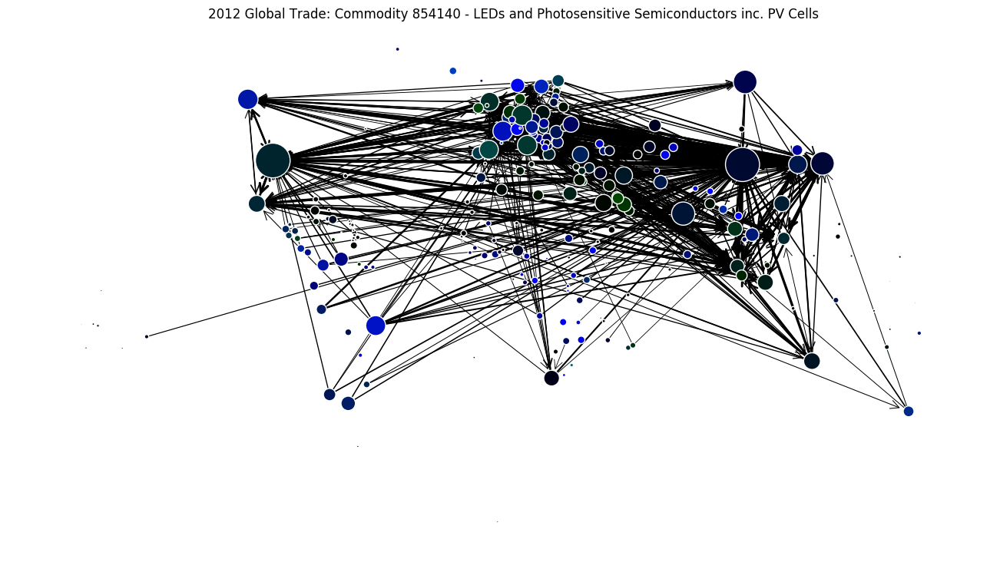

2012 854150
[u'AU' u'AT' u'BE' u'BR' u'BG' u'CA' u'CN' u'CR' u'CZ' u'DK' u'FI' u'FR'
 u'DE' u'GR' u'HU' u'ID' u'IE' u'IL' u'IT' u'JP' u'KR' u'MX' u'OM' u'NL'
 u'PK' u'PG' u'PL' u'RO' u'SG' u'VN' u'ZA' u'ES' u'SE' u'CH' u'TH' u'AE'
 u'TN' u'TR' u'GB' u'US' u'MY' u'IN' u'MA' u'PH']


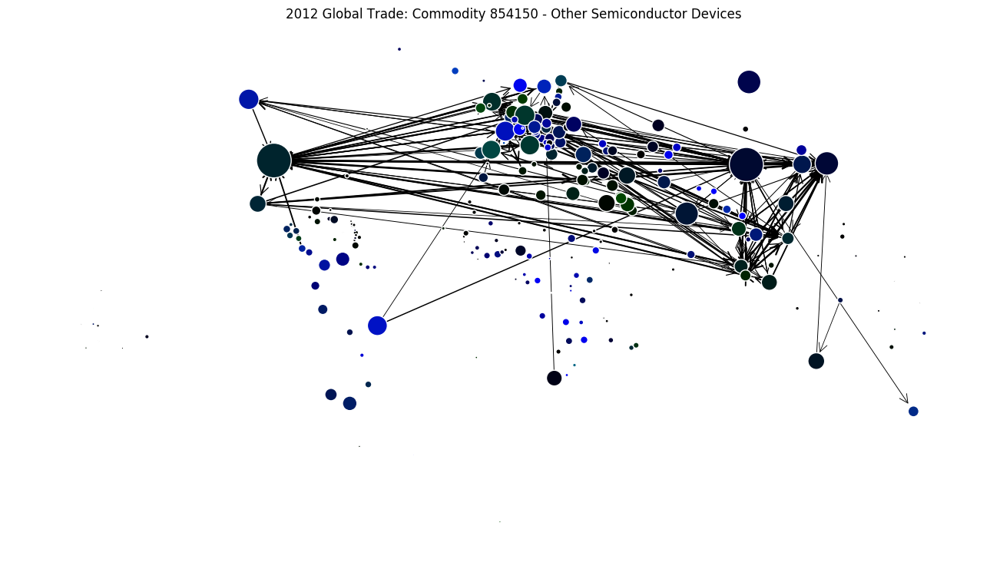

2013
2013 2716
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BW' u'BR' u'BG' u'BY' u'CA'
 u'CN' u'CO' u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'DE' u'GR'
 u'GT' u'HU' u'IE' u'IT' u'KZ' u'JO' u'LV' u'LT' u'MY' u'MX' u'MN' u'ME'
 u'NL' u'NO' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA' u'ZW' u'ES'
 u'SE' u'CH' u'TH' u'TR' u'UG' u'MK' u'GB' u'US' u'BJ' u'PS' u'MZ' u'NE'
 u'UA' u'EG' u'MA' u'VE']


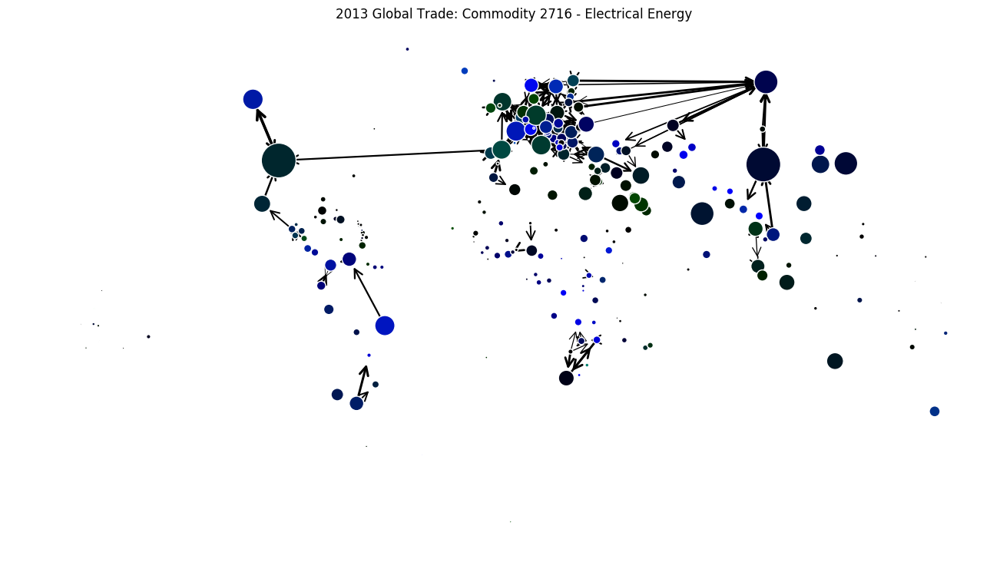

2013 271600
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BW' u'BR' u'BG' u'BY' u'CA'
 u'CN' u'CO' u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'DE' u'GR'
 u'GT' u'HU' u'IE' u'IT' u'KZ' u'JO' u'LV' u'LT' u'MY' u'MX' u'MN' u'ME'
 u'NL' u'NO' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA' u'ZW' u'ES'
 u'SE' u'CH' u'TH' u'TR' u'UG' u'MK' u'GB' u'US' u'BJ' u'PS' u'MZ' u'NE'
 u'UA' u'EG' u'MA' u'VE']


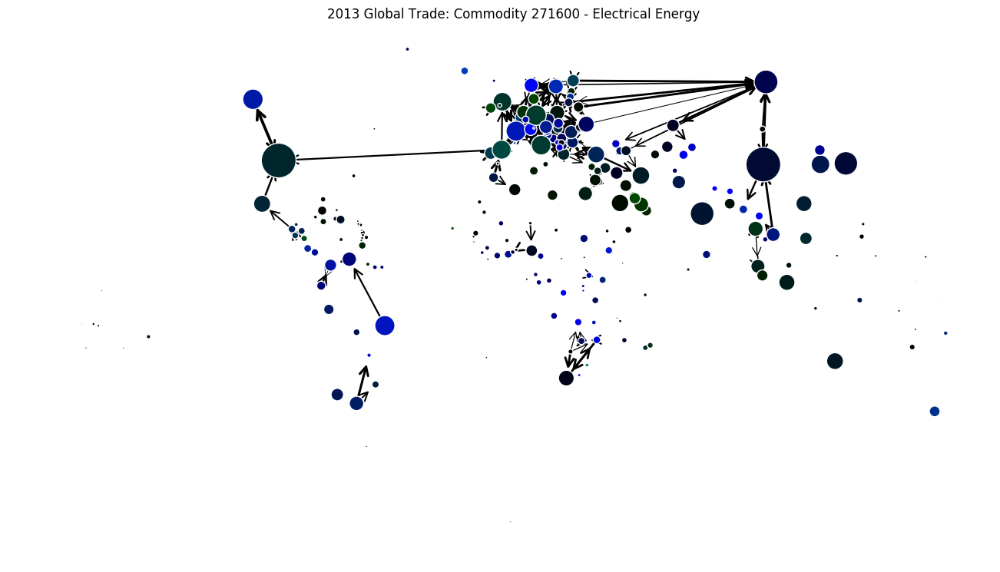

2013 850231
[u'AZ' u'AU' u'AT' u'BE' u'BO' u'BR' u'BG' u'BY' u'CA' u'LK' u'CL' u'CN'
 u'HR' u'CZ' u'EC' u'EE' u'FI' u'FR' u'DE' u'GR' u'ID' u'IE' u'IT' u'JP'
 u'KZ' u'KR' u'LV' u'MX' u'NL' u'NO' u'PK' u'PE' u'PL' u'PT' u'RO' u'RU'
 u'IN' u'SG' u'ZA' u'ES' u'SE' u'CH' u'TH' u'TR' u'MK' u'GB' u'US' u'UY'
 u'ET' u'UA' u'EG' u'MA' u'VE']


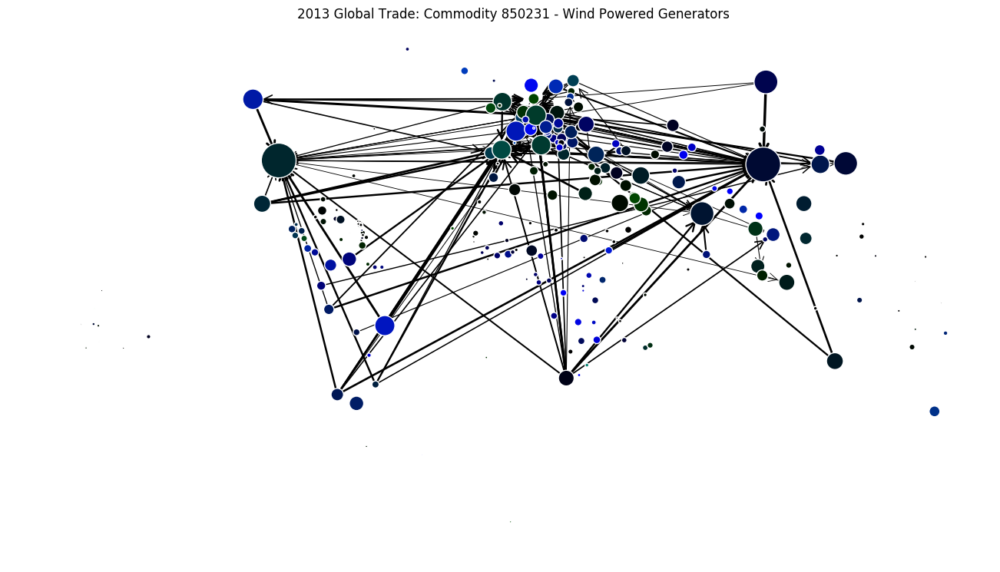

2013 854140
[u'DZ' u'AR' u'AU' u'AT' u'BS' u'BD' u'BE' u'BO' u'BA' u'BR' u'BG' u'MM'
 u'BY' u'KH' u'CA' u'LK' u'CL' u'CN' u'CO' u'CR' u'HR' u'CY' u'CZ' u'DK'
 u'EC' u'SV' u'EE' u'FI' u'FR' u'PF' u'DE' u'GH' u'GR' u'GT' u'GN' u'HU'
 u'ID' u'IE' u'IL' u'IT' u'JP' u'KZ' u'JO' u'KR' u'KW' u'LA' u'LV' u'LT'
 u'LU' u'MG' u'MY' u'MT' u'MU' u'MX' u'NP' u'NL' u'NZ' u'NI' u'NO' u'PK'
 u'PA' u'PE' u'PL' u'PT' u'QA' u'RO' u'RU' u'SA' u'RS' u'IN' u'SG' u'SK'
 u'VN' u'SI' u'ZA' u'ZW' u'ES' u'SE' u'CH' u'TH' u'AE' u'TN' u'TR' u'UG'
 u'MK' u'GB' u'TZ' u'US' u'AO' u'ET' u'JM' u'KE' u'MR' u'MZ' u'NG' u'UA'
 u'EG' u'BF' u'BB' u'MA' u'PH' u'VE']


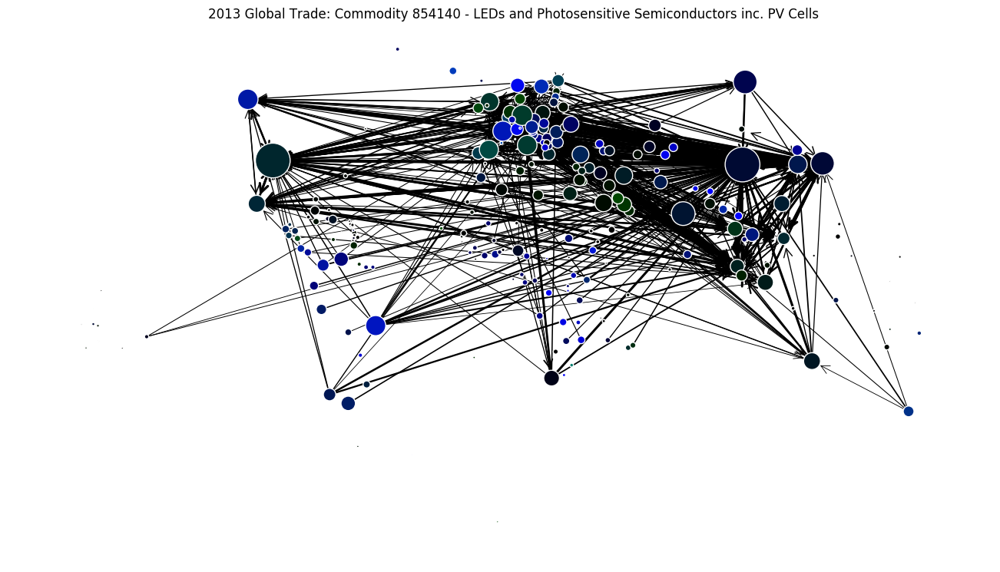

2013 854150
[u'AT' u'BE' u'BR' u'BG' u'CA' u'CN' u'CR' u'CZ' u'DK' u'FI' u'FR' u'DE'
 u'HU' u'ID' u'IE' u'IL' u'IT' u'JP' u'KR' u'MY' u'MT' u'MX' u'NL' u'PL'
 u'RO' u'RU' u'IN' u'SG' u'VN' u'ES' u'SE' u'CH' u'TH' u'AE' u'TN' u'TR'
 u'GB' u'US' u'AO' u'MA' u'PH']


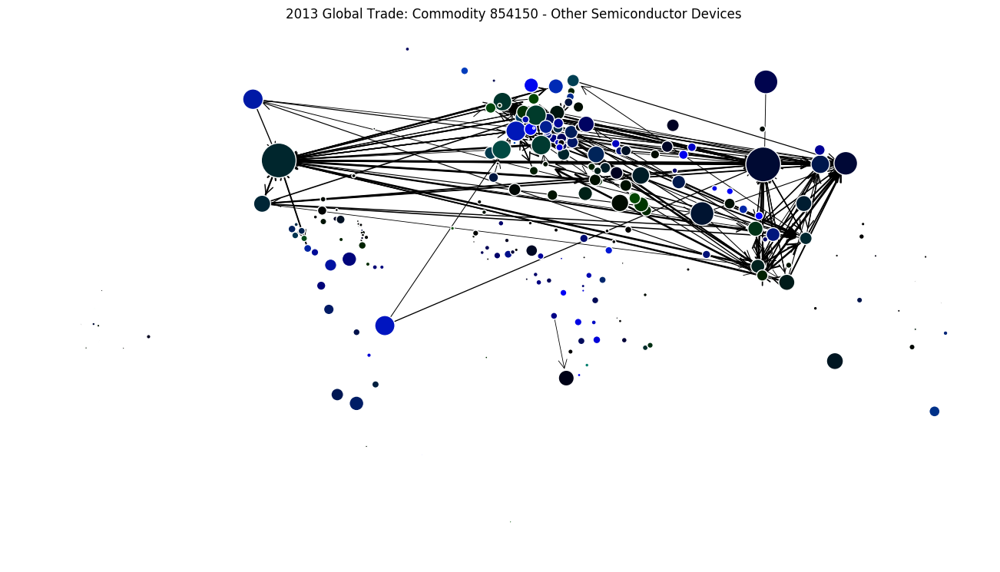

2014
2014 2716
[u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BW' u'BR' u'BG' u'BY' u'CA' u'CN'
 u'CO' u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'DE' u'GR' u'GT'
 u'HU' u'IE' u'IT' u'KZ' u'JO' u'LA' u'LV' u'LT' u'MY' u'MX' u'MN' u'ME'
 u'NL' u'NO' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA' u'ZW' u'ES'
 u'SE' u'CH' u'TH' u'TR' u'UG' u'UA' u'MK' u'EG' u'GB' u'US' u'BJ' u'PS'
 u'MZ' u'NE' u'MA']


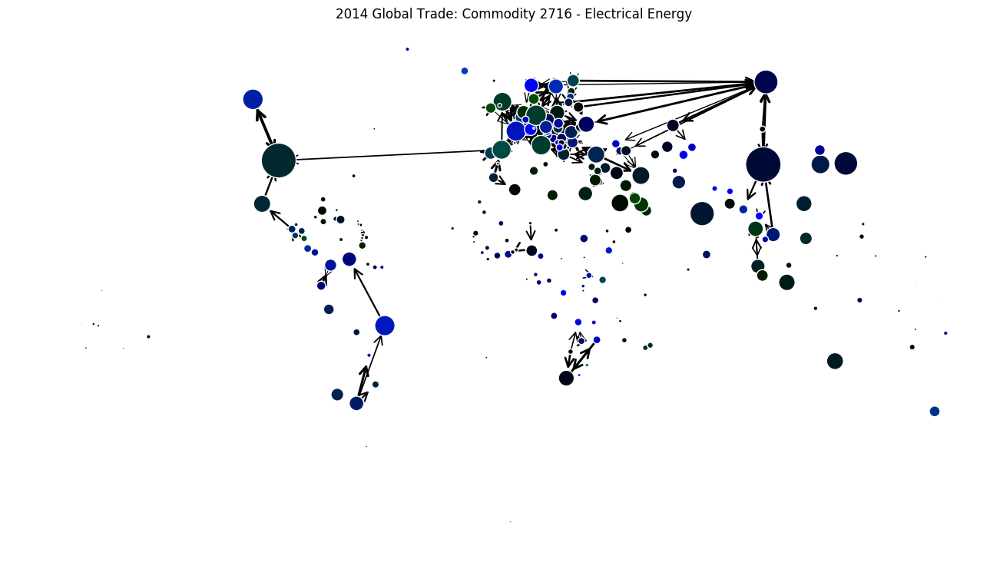

2014 271600
[u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BW' u'BR' u'BG' u'BY' u'CA' u'CN'
 u'CO' u'HR' u'CZ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'DE' u'GR' u'GT'
 u'HU' u'IE' u'IT' u'KZ' u'JO' u'LA' u'LV' u'LT' u'MY' u'MX' u'MN' u'ME'
 u'NL' u'NO' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA' u'ZW' u'ES'
 u'SE' u'CH' u'TH' u'TR' u'UG' u'UA' u'MK' u'EG' u'GB' u'US' u'BJ' u'PS'
 u'MZ' u'NE' u'MA']


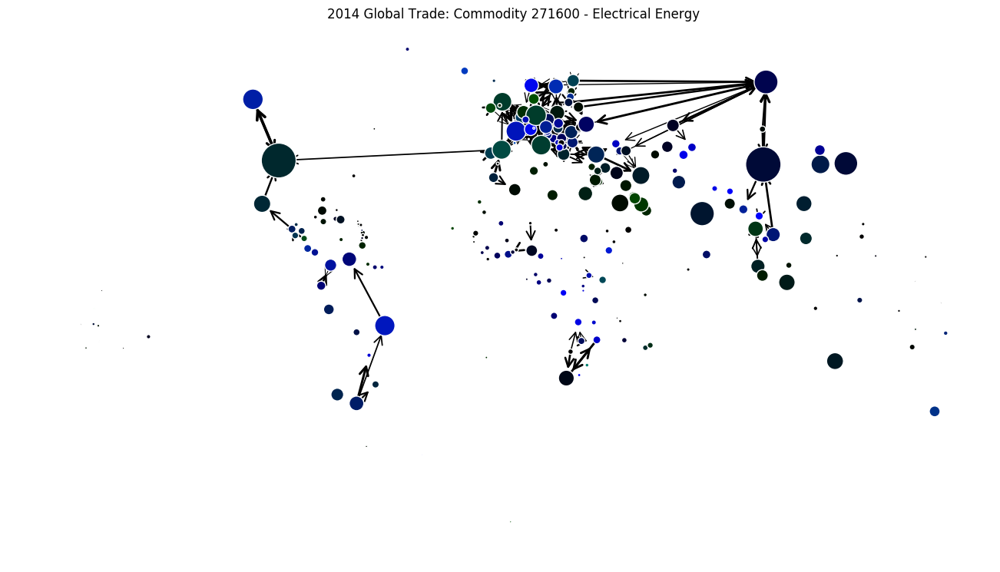

2014 850231
[u'AZ' u'AU' u'AT' u'BE' u'BR' u'BG' u'BY' u'CA' u'LK' u'CL' u'CN' u'CR'
 u'HR' u'CZ' u'ET' u'FI' u'FR' u'DE' u'GR' u'HN' u'IT' u'JP' u'KZ' u'KR'
 u'MX' u'NL' u'NZ' u'NO' u'PK' u'PL' u'PT' u'RO' u'RU' u'ZA' u'ES' u'SE'
 u'TH' u'TR' u'UA' u'MK' u'GB' u'US' u'UY' u'MA']


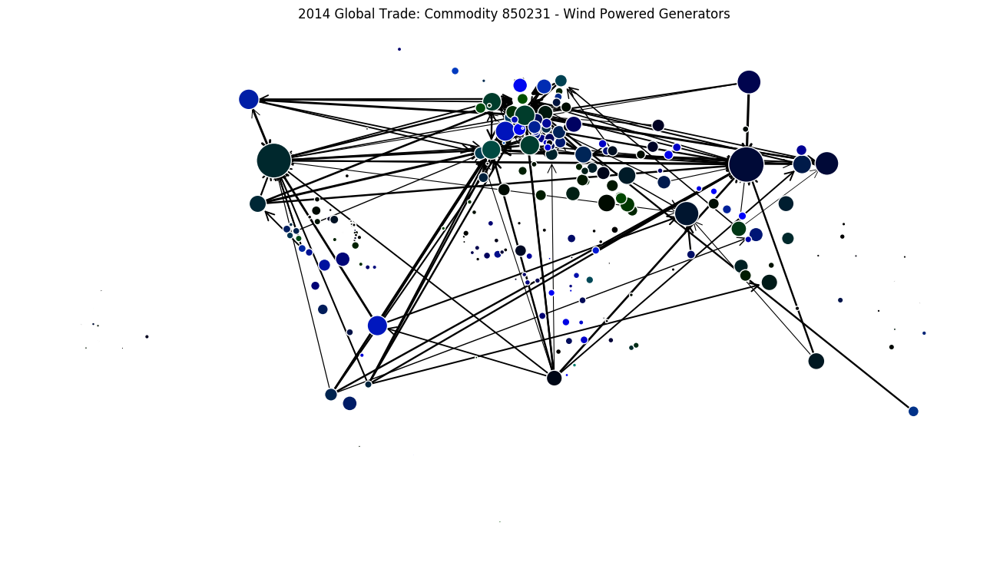

2014 854140
[u'DZ' u'AO' u'AR' u'AU' u'AT' u'BS' u'BE' u'BO' u'BA' u'BR' u'BG' u'MM'
 u'BY' u'KH' u'CM' u'CA' u'LK' u'CL' u'CN' u'CO' u'CG' u'CR' u'HR' u'CY'
 u'CZ' u'DK' u'EC' u'SV' u'ET' u'EE' u'FJ' u'FI' u'FR' u'PF' u'DE' u'GR'
 u'GT' u'HN' u'HU' u'ID' u'IE' u'IL' u'IT' u'JM' u'JP' u'KZ' u'JO' u'KR'
 u'KW' u'LA' u'LB' u'LV' u'LT' u'LU' u'MG' u'MY' u'MV' u'MT' u'MU' u'MX'
 u'NP' u'NL' u'AW' u'NZ' u'NI' u'NO' u'PK' u'PA' u'PY' u'PE' u'PL' u'PT'
 u'QA' u'RO' u'RU' u'RW' u'SA' u'RS' u'IN' u'SG' u'SK' u'VN' u'SI' u'ZA'
 u'ES' u'SE' u'CH' u'TH' u'TO' u'AE' u'TN' u'TR' u'UG' u'UA' u'MK' u'EG'
 u'GB' u'TZ' u'US' u'UY' u'YE' u'MR' u'NG' u'SN' u'TG' u'BF' u'BB' u'MA'
 u'PH']


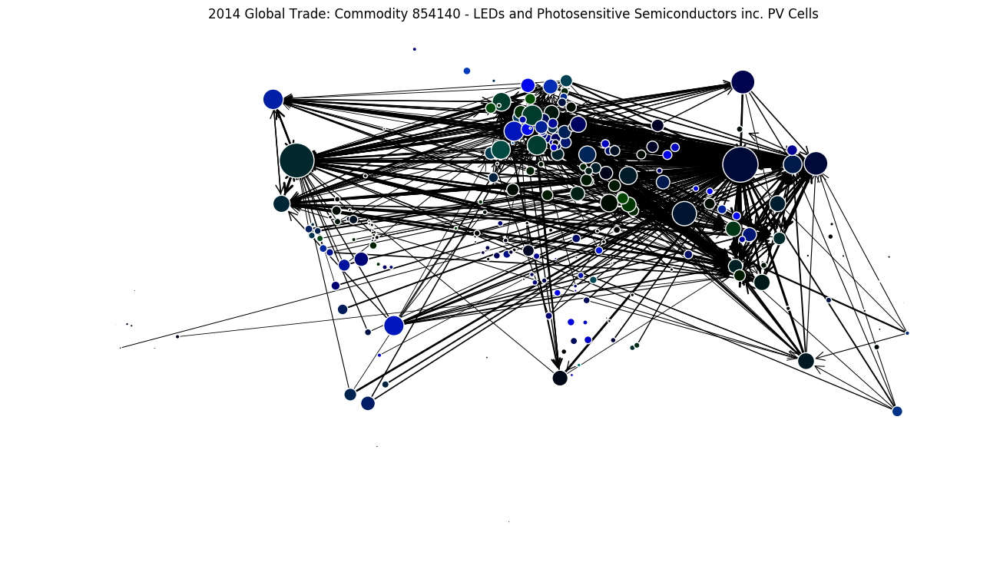

2014 854150
[u'DZ' u'AT' u'BE' u'BR' u'BG' u'CA' u'CN' u'CR' u'CZ' u'DK' u'FI' u'FR'
 u'DE' u'HU' u'ID' u'IE' u'IL' u'IT' u'JP' u'KR' u'KW' u'MY' u'MT' u'MX'
 u'NL' u'NZ' u'PL' u'RU' u'IN' u'SG' u'VN' u'ES' u'SE' u'CH' u'TH' u'TR'
 u'EG' u'GB' u'US' u'NE' u'NG' u'SR' u'MA' u'PH']


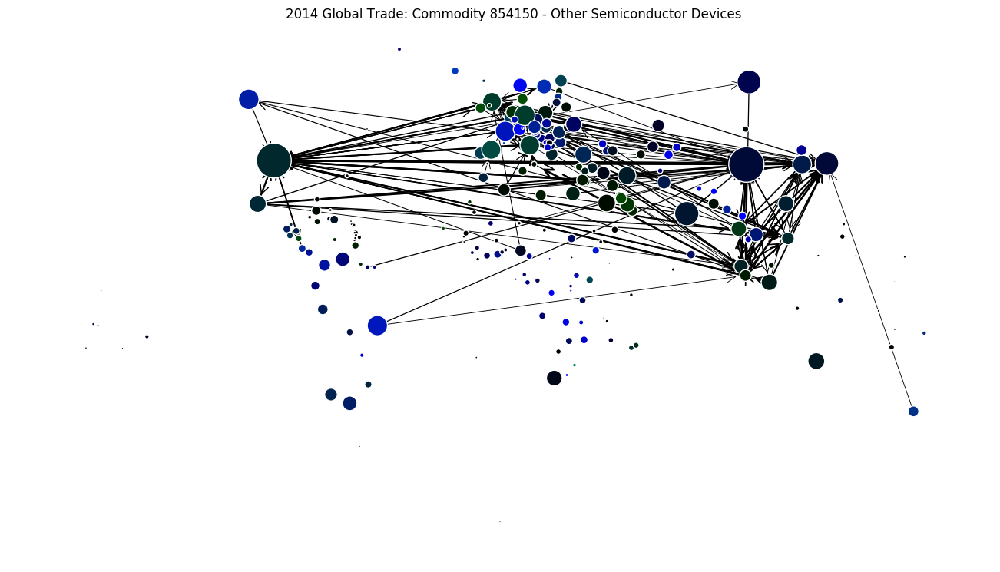

2015
2015 2716
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BW' u'BR' u'BG' u'BY' u'CA'
 u'CN' u'CO' u'HR' u'CZ' u'BJ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'PS'
 u'DE' u'GR' u'GT' u'HU' u'IE' u'IT' u'KZ' u'JO' u'KG' u'LA' u'LV' u'LT'
 u'MY' u'MT' u'MX' u'MN' u'ME' u'MA' u'NL' u'NE' u'NO' u'PK' u'PL' u'PT'
 u'RO' u'RU' u'RS' u'IN' u'VN' u'SI' u'ZA' u'ZW' u'ES' u'SE' u'CH' u'TH'
 u'TR' u'UG' u'UA' u'MK' u'GB' u'US' u'MZ']


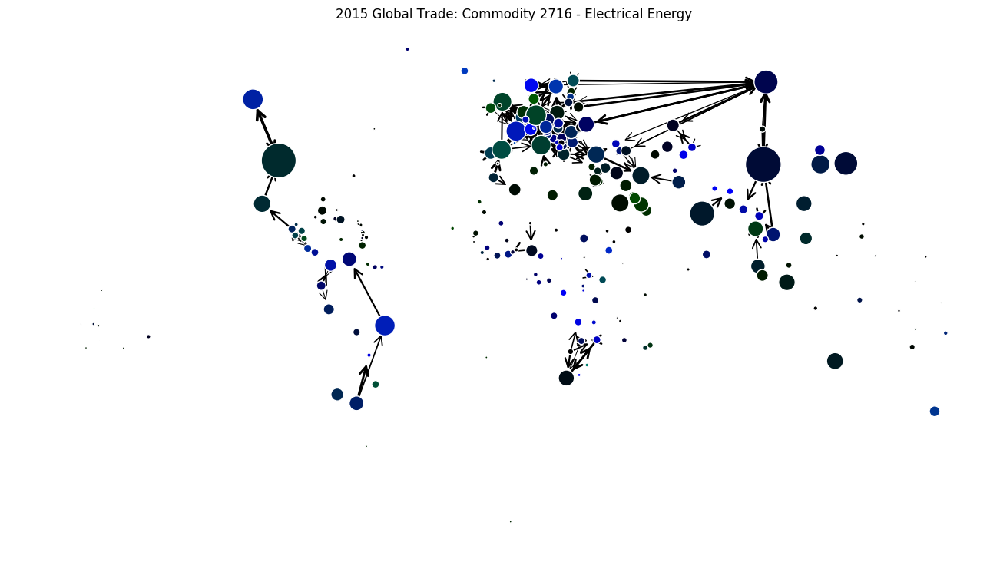

2015 271600
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BW' u'BR' u'BG' u'BY' u'CA'
 u'CN' u'CO' u'HR' u'CZ' u'BJ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'PS'
 u'DE' u'GR' u'GT' u'HU' u'IE' u'IT' u'KZ' u'JO' u'KG' u'LA' u'LV' u'LT'
 u'MY' u'MT' u'MX' u'MN' u'ME' u'MA' u'NL' u'NE' u'NO' u'PK' u'PL' u'PT'
 u'RO' u'RU' u'RS' u'IN' u'VN' u'SI' u'ZA' u'ZW' u'ES' u'SE' u'CH' u'TH'
 u'TR' u'UG' u'UA' u'MK' u'GB' u'US' u'MZ']


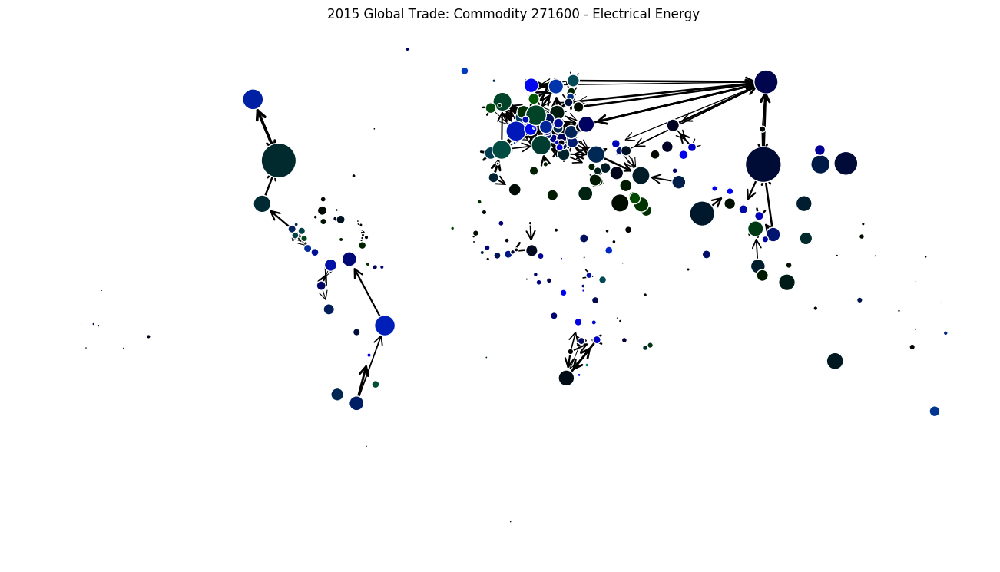

2015 850231
[u'AT' u'BO' u'BR' u'BG' u'BY' u'CA' u'LK' u'CL' u'CN' u'CR' u'HR' u'FI'
 u'FR' u'DE' u'GR' u'IL' u'IT' u'JP' u'KZ' u'JO' u'KR' u'LT' u'MX' u'NL'
 u'NZ' u'NO' u'PK' u'PE' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'ZA' u'ES'
 u'SE' u'TH' u'TR' u'GB' u'US' u'UY']


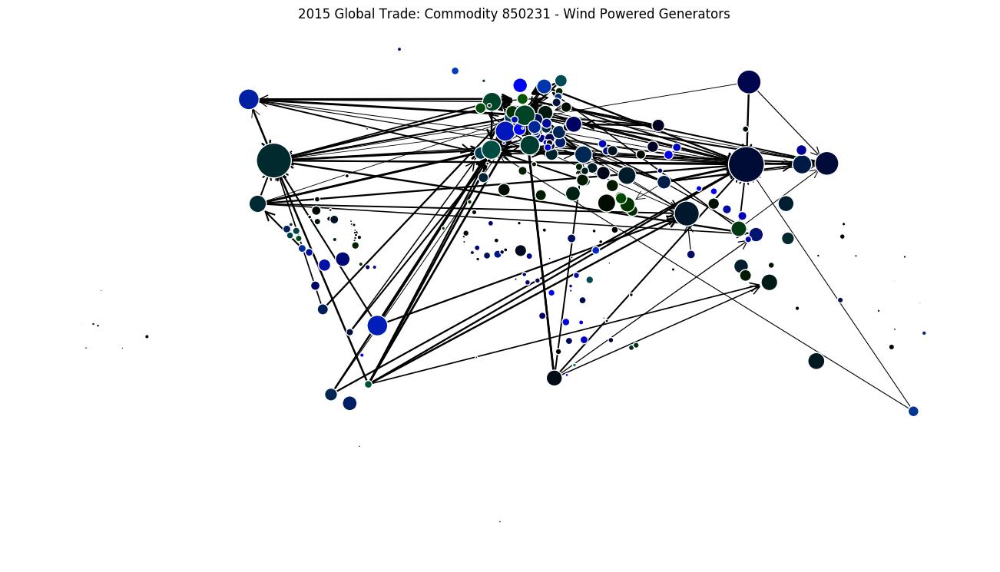

2015 854140
[u'DZ' u'AO' u'AZ' u'AR' u'AU' u'AT' u'BS' u'BH' u'BD' u'BE' u'BO' u'BA'
 u'BR' u'SB' u'BG' u'MM' u'BY' u'KH' u'CA' u'LK' u'CL' u'CN' u'CO' u'CR'
 u'HR' u'CY' u'CZ' u'BJ' u'DK' u'EC' u'SV' u'ET' u'EE' u'FI' u'FR' u'GE'
 u'DE' u'GR' u'GT' u'GN' u'HN' u'HU' u'ID' u'IE' u'IL' u'IT' u'CI' u'JM'
 u'JP' u'KZ' u'JO' u'KR' u'KW' u'LV' u'LT' u'LU' u'MG' u'MW' u'MY' u'MV'
 u'MT' u'MX' u'MA' u'NP' u'NL' u'NZ' u'NI' u'NO' u'PK' u'PA' u'PY' u'PE'
 u'PL' u'PT' u'QA' u'RO' u'RU' u'RW' u'SA' u'SN' u'RS' u'IN' u'SG' u'SK'
 u'VN' u'SI' u'ZA' u'ZW' u'ES' u'SE' u'CH' u'TH' u'TG' u'AE' u'TN' u'TR'
 u'UG' u'UA' u'MK' u'EG' u'GB' u'TZ' u'US' u'BF' u'UY' u'WS' u'YE' u'AG'
 u'MZ' u'BB' u'PH']


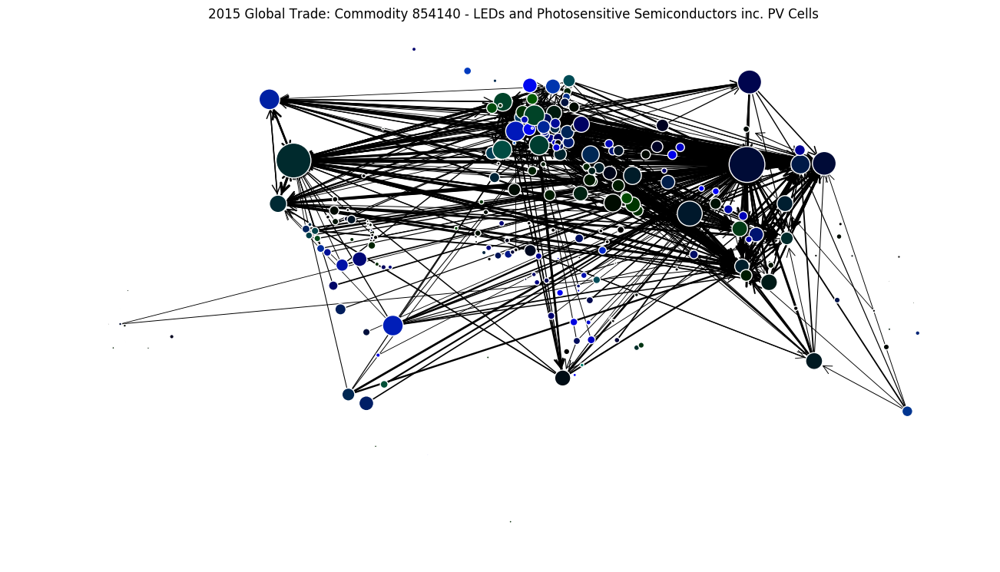

2015 854150
[u'DZ' u'AT' u'BE' u'BR' u'BG' u'CA' u'CN' u'CR' u'CZ' u'DK' u'ET' u'FI'
 u'FR' u'DE' u'HU' u'ID' u'IE' u'IL' u'IT' u'JP' u'KR' u'MY' u'MT' u'MX'
 u'NL' u'PL' u'RU' u'IN' u'SG' u'VN' u'ES' u'SE' u'CH' u'TH' u'TR' u'EG'
 u'GB' u'TZ' u'US' u'PH']


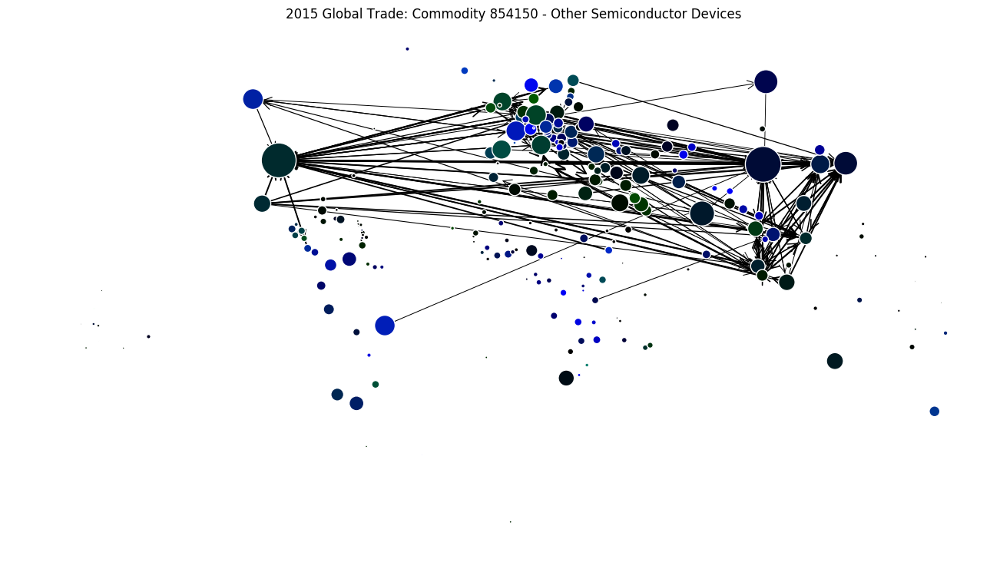

2016
2016 2716
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BW' u'BR' u'BG' u'BY' u'CA'
 u'CN' u'CO' u'HR' u'CZ' u'BJ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'GE'
 u'PS' u'DE' u'GH' u'GR' u'GT' u'HU' u'ID' u'IE' u'IT' u'KZ' u'JO' u'KG'
 u'LA' u'LV' u'LT' u'MY' u'MT' u'MX' u'MN' u'ME' u'MA' u'NL' u'NE' u'NO'
 u'PK' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA' u'ZW' u'ES' u'SE'
 u'CH' u'TH' u'TR' u'UG' u'UA' u'MK' u'GB' u'US' u'MZ']


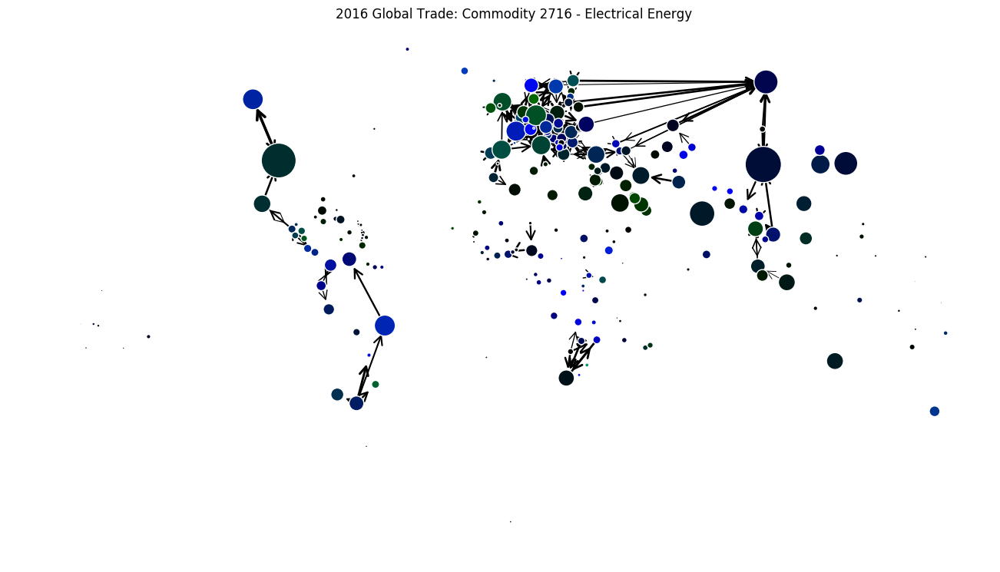

2016 271600
[u'AL' u'AZ' u'AR' u'AT' u'AM' u'BE' u'BA' u'BW' u'BR' u'BG' u'BY' u'CA'
 u'CN' u'CO' u'HR' u'CZ' u'BJ' u'DK' u'EC' u'SV' u'EE' u'FI' u'FR' u'GE'
 u'PS' u'DE' u'GH' u'GR' u'GT' u'HU' u'ID' u'IE' u'IT' u'KZ' u'JO' u'KG'
 u'LA' u'LV' u'LT' u'MY' u'MT' u'MX' u'MN' u'ME' u'MA' u'NL' u'NE' u'NO'
 u'PK' u'PL' u'PT' u'RO' u'RU' u'RS' u'VN' u'SI' u'ZA' u'ZW' u'ES' u'SE'
 u'CH' u'TH' u'TR' u'UG' u'UA' u'MK' u'GB' u'US' u'MZ']


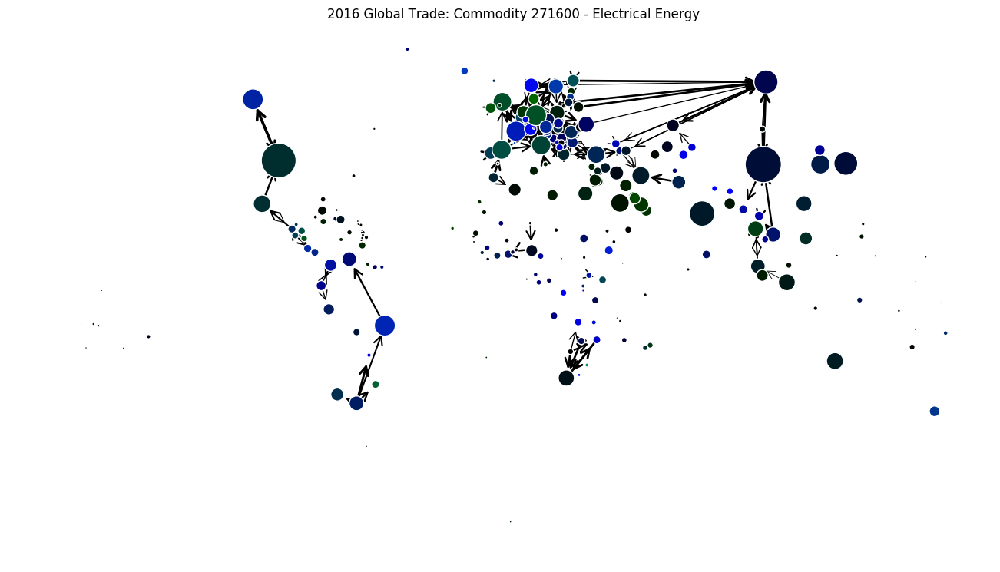

2016 850231
[u'AU' u'AT' u'BE' u'BR' u'BG' u'BY' u'CA' u'LK' u'CL' u'CN' u'CR' u'HR'
 u'DK' u'FI' u'FR' u'GE' u'DE' u'GR' u'HN' u'IE' u'IT' u'JP' u'KZ' u'KR'
 u'KW' u'LT' u'MX' u'ME' u'NL' u'NZ' u'NO' u'PK' u'PL' u'PT' u'RU' u'SA'
 u'RS' u'IN' u'ZA' u'ES' u'SE' u'CH' u'TH' u'AE' u'TR' u'UA' u'EG' u'GB'
 u'US' u'UY']


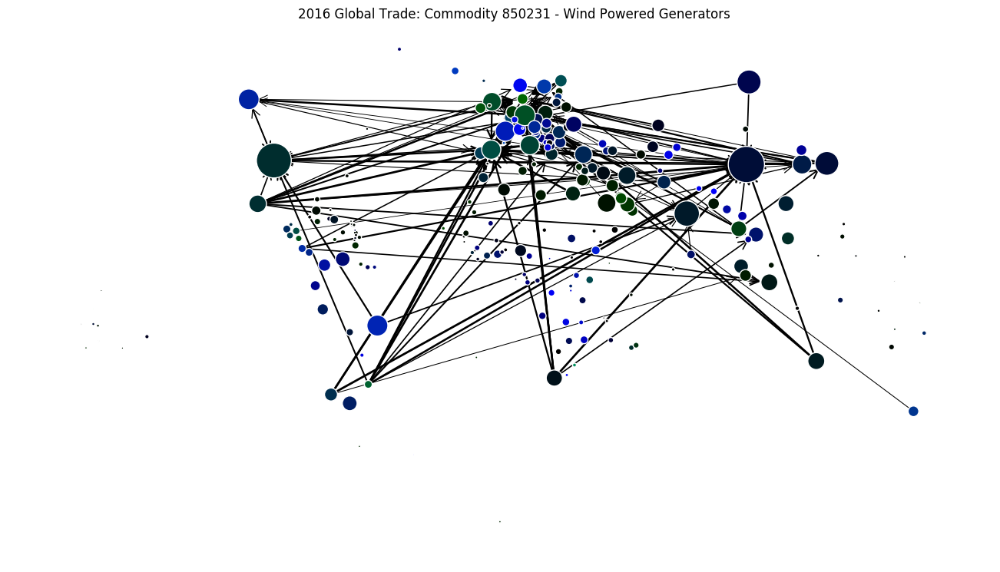

2016 854140
[u'DZ' u'AR' u'AU' u'AT' u'BE' u'BO' u'BA' u'BW' u'BR' u'BG' u'MM' u'BY'
 u'KH' u'CM' u'CA' u'LK' u'CL' u'CN' u'CO' u'CR' u'HR' u'CY' u'CZ' u'BJ'
 u'DK' u'EC' u'SV' u'EE' u'FJ' u'FI' u'FR' u'PS' u'DE' u'GH' u'GR' u'GT'
 u'HN' u'HU' u'ID' u'IE' u'IL' u'IT' u'JM' u'JP' u'KZ' u'JO' u'KR' u'KW'
 u'KG' u'LB' u'LV' u'LT' u'LU' u'MG' u'MY' u'MV' u'ML' u'MT' u'MR' u'MU'
 u'MX' u'MN' u'MA' u'NP' u'NL' u'NZ' u'NI' u'NE' u'NG' u'NO' u'PK' u'PA'
 u'PE' u'PL' u'PT' u'RO' u'RU' u'RW' u'SA' u'SN' u'RS' u'IN' u'SG' u'SK'
 u'VN' u'SI' u'ZA' u'ZW' u'ES' u'SE' u'CH' u'TH' u'TG' u'AE' u'TN' u'TR'
 u'UG' u'UA' u'MK' u'EG' u'GB' u'TZ' u'US' u'BF' u'UY' u'WS' u'ET' u'MZ'
 u'PH']


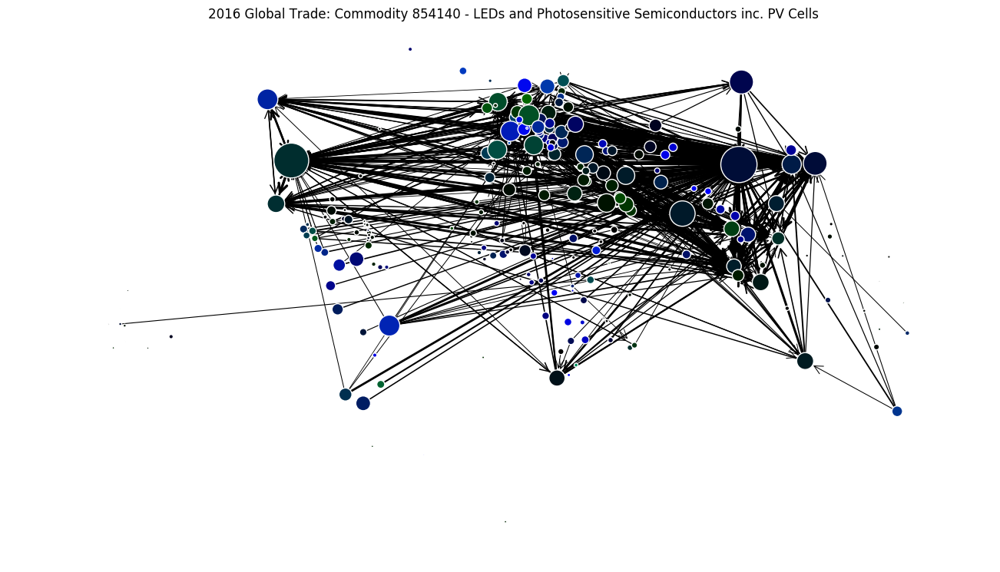

2016 854150
[u'DZ' u'AT' u'BE' u'BG' u'CA' u'CN' u'CZ' u'DK' u'FI' u'FR' u'DE' u'HU'
 u'ID' u'IE' u'IL' u'IT' u'JP' u'KR' u'MY' u'MT' u'MX' u'MA' u'NL' u'PL'
 u'RU' u'IN' u'SG' u'VN' u'ZA' u'ES' u'SE' u'CH' u'TH' u'TR' u'GB' u'US'
 u'ET' u'BB' u'PH']


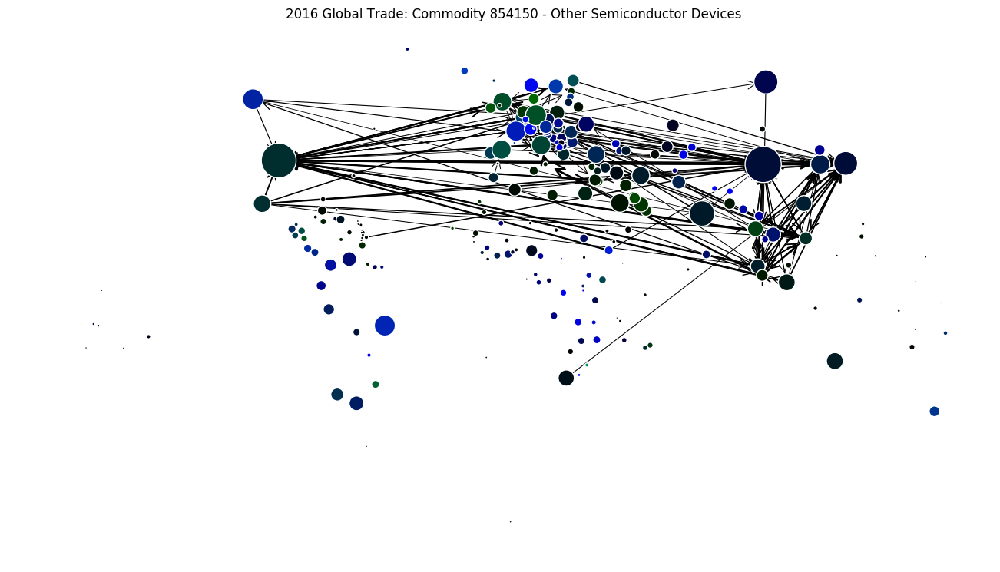

2017
2017 2716
[]


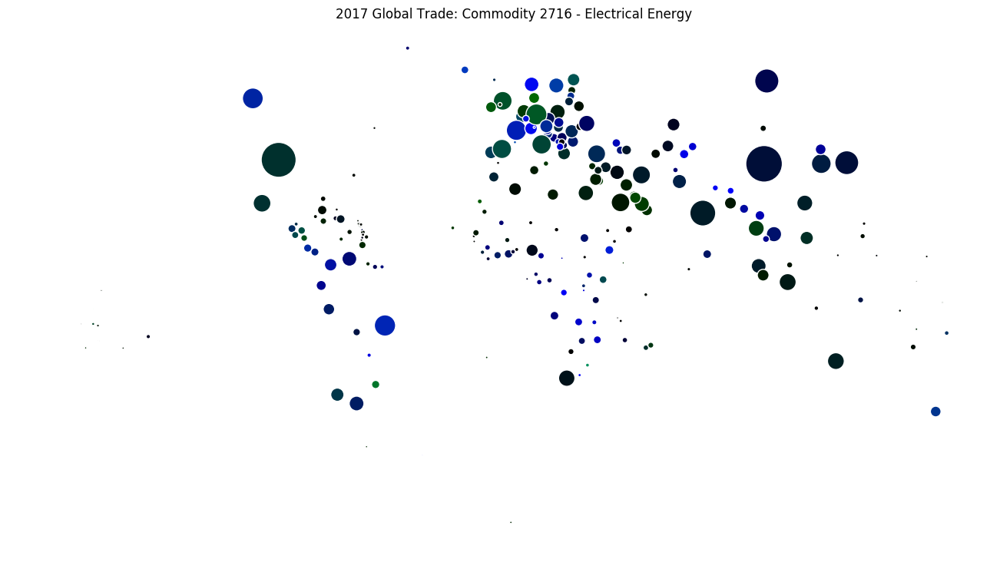

2017 271600
[]


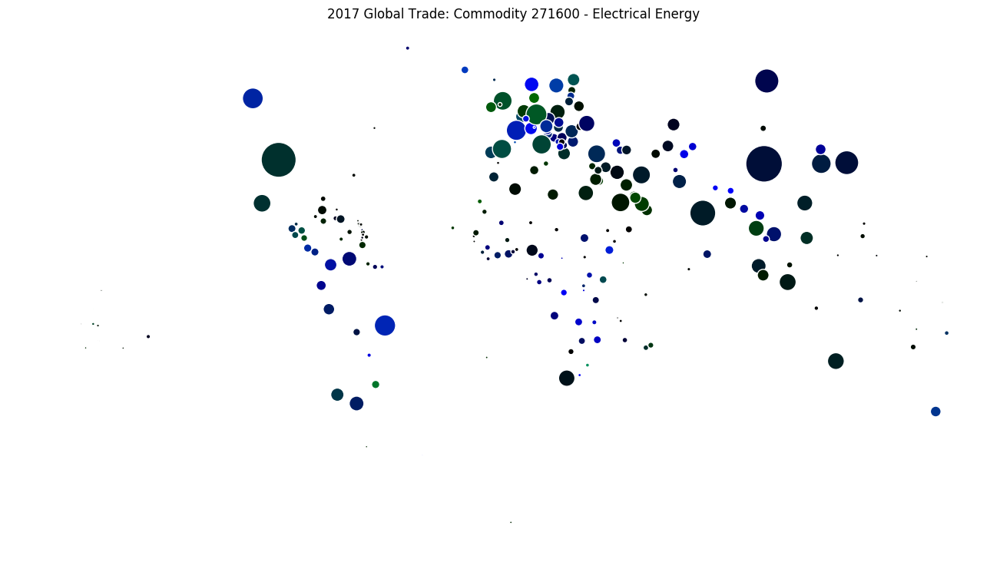

2017 850231
[]


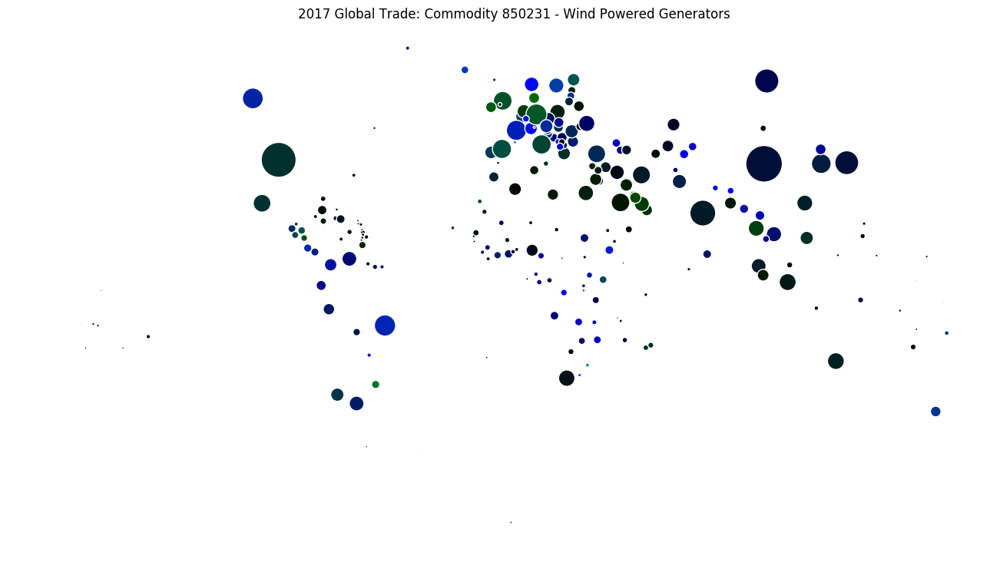

2017 854140
[]


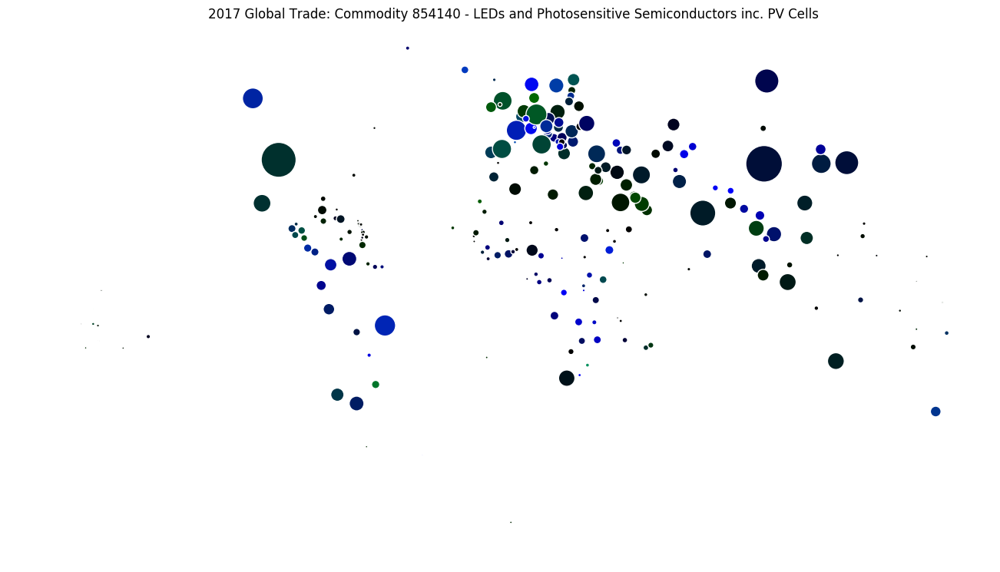

2017 854150
[]


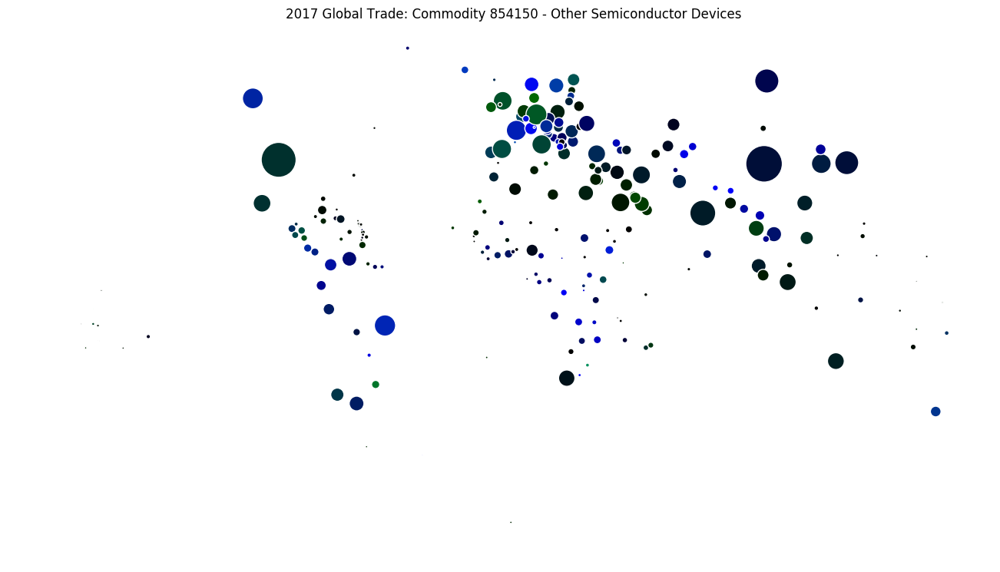

In [41]:
thresh=1000000.0

labels_dict = {
    '2716': ' - Electrical Energy',
    '271600': ' - Electrical Energy',
    '850231': ' - Wind Powered Generators',
    '854140': ' - LEDs and Photosensitive Semiconductors inc. PV Cells',
    '854150': ' - Other Semiconductor Devices',
    'TOTAL': ' - All Trade Goods',
}


for y in range(2007,2018):
    print y
    for c in commodities[0:-1]:
    
        print y, c

        """ makem nodes"""
        for iso2 in df_iso2.index.values:
            #print iso2
            try:
                g = int(df_iso2.get_value(iso2,str(y)+'_g')/df_iso2.get_value(iso2,str(y)+'_all')*255)
                b = int(df_iso2.get_value(iso2,str(y)+'_b')/df_iso2.get_value(iso2,str(y)+'_all')*255)
                size=np.sqrt(df_iso2.get_value(iso2,str(y)+'_all'))#/np.log(1.5)*5.0
            except:
                g=0.0
                b=0.0
                size=1.0
    
            #print size
    

            nodes_list.append(
                (iso2,{
                    'type': 'country',
                    'region': df_iso2.get_value(iso2,'SIPS_REGION'),
                    'pos':np.array([df_centroids.get_value(iso2,'longitude'),df_centroids.get_value(iso2,'latitude')]),
                    'n_color':"#{0:02x}{1:02x}{2:02x}".format(clamp(0), clamp(g), clamp(b)),
                    'n_alpha':1.0,
                    'n_size':size
                    })            
                )
        """makem edges"""
        edges_list = []
        
    
        df_slice = df_goods[(df_goods['Commodity Code']==c)&(df_goods['Year']==y)&(df_goods['Trade Flow']=='Import')&(df_goods['Trade Value (US$)']>=thresh)]
        reporters = df_slice['reporter_iso'].unique()
        print reporters
        
        for r in reporters:
            
            partners = df_slice[df_slice.reporter_iso==r].partner_iso.unique()
            
            
            for p in partners:
                
                val = df_slice[(df_slice['reporter_iso']==r)&(df_slice['partner_iso']==p)].iloc[0]['Trade Value (US$)']
                        
                edges_list.append(
                    (r,p,{
                        'weight': np.log10(val),
                        'value': val,
                        'type': 'trade-import',
                        'e_color': 'black',
                        'e_alpha': 1.0
                    })
                )

    
        G = nx.DiGraph(directed=True)

        G.add_nodes_from(nodes_list)
        G.add_edges_from(edges_list)

        fig, ax = plt.subplots(figsize=(16,9 ), dpi=100)

        pos = nx.get_node_attributes(G,'pos')
    
        options = {
            'arrowstyle': '->',
            'arrowsize': 12,
            }
        
        #print [(np.sqrt(np.log(nx.get_edge_attributes(G,'value')[e])-3.0)) for e in G.edges()]


        ### Draw Edges
        nx.draw_networkx_edges(G,
                               pos,
                               edgelist =G.edges(),
                               ax=ax,
                               width=[((np.sqrt(np.log(nx.get_edge_attributes(G,'value')[e])-3.0)-3.0)/.5) for e in G.edges()],
                               edge_color=[nx.get_edge_attributes(G,'e_color')[e] for e in G.edges()],
                               alpha=1.0, 
                               arrowstyle='->',
                               arrowsize=20
                              )
        
        ### Draw Nodes
    
        #print [nx.get_node_attributes(G,'n_size')[n]*15 for n in G.nodes()]
        nodes_ax = nx.draw_networkx_nodes(G,
                                          pos,
                                          ax=ax,
                                          nodelist=G.nodes(),
                                          node_size = [nx.get_node_attributes(G,'n_size')[n] for n in G.nodes()],
                                          node_color = [nx.get_node_attributes(G,'n_color')[n] for n in G.nodes()],
                                          alpha= [nx.get_node_attributes(G,'n_alpha')[n] for n in G.nodes()]
                                          )
                                          
        
             

        nodes_ax.set_edgecolor('w')


        plt.axis('off')
        plt.title(str(y)+' Global Trade: Commodity '+c+labels_dict[c])
        fig.savefig('./figures/country_layer/'+str(y)+'_'+c+'.png')
        plt.show()

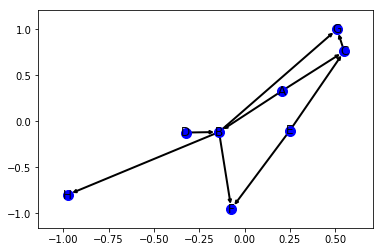

In [6]:
import networkx as nx

G = nx.DiGraph()
G.add_edges_from(
    [('A', 'B'), ('A', 'C'), ('D', 'B'), ('E', 'C'), ('E', 'F'),
     ('B', 'H'), ('B', 'G'), ('B', 'F'), ('C', 'G')])

val_map = {'A': 1.0,
           'D': 0.5714285714285714,
           'H': 0.0}

values = [val_map.get(node, 0.25) for node in G.nodes()]

# Specify the edges you want here
red_edges = [('A', 'C'), ('E', 'C')]
edge_colours = ['black' if not edge in red_edges else 'red'
                for edge in G.edges()]
black_edges = [edge for edge in G.edges() if edge not in red_edges]

# Need to create a layout when doing
# separate calls to draw nodes and edges
#pos = nx.spring_layout(G)

options = {
    'node_color': 'blue',
    'node_size': 100,
    'width': 2,
    'arrowstyle': '-|>',
    'arrowsize': 6,
}

nx.draw_networkx(G, arrows=True, **options)


plt.show()

In [ ]:
years = df_goods.Year.unique()
thresh=1000000.0

edges_dict = {}
for c in commodities:
    print c
    edges_dict[c] = {}
    for y in years:
        print y
        edges_dict[c][y] = []
    
        df_slice = df_goods[(df_goods['Commodity Code']==c)&(df_goods['Year']==y)&(df_goods['Trade Flow']=='Import')&(df_goods['Trade Value (US$)']>=thresh)]
        reporters = df_slice['reporter_iso'].unique()
        print reporters
        
        for r in reporters:
            
            partners = df_slice[df_slice.reporter_iso==r].partner_iso.unique()
            
            
            for p in partners:
                
                val = df_slice[(df_slice['reporter_iso']==r)&(df_slice['partner_iso']==p)].iloc[0]['Trade Value (US$)']
                        
                edges_dict[c][y].append(
                    (r,p,{
                        'weight': np.log10(val),
                        'value': val,
                        'type': 'trade-import',
                        'e_color': 'black',
                        'e_alpha': 1.0
                    })
                )

        for e in edges_dict[c][y]:
            print e
            
        
    